In [11]:
!pip install opencxr opencv-python && pip install --upgrade numpy scipy statsmodels numba pyarrow matplotlib

INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 16.8 MB/s eta 0:00:0000:0100:01m
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.12.0.88
    Uninstalling opencv-python-4.12.0.88:
      Successfully uninstalled opencv-python-4.12.0.88
  Using cached numpy-2.3.2-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (62 kB)
  Using cached numpy-2.2.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.0
    Uninstalling numpy-1.26.0:
      Successfully uninstalled numpy-1.26.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This beha

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import opencxr
from opencxr.utils.file_io import read_file, write_file
from opencxr.utils.resize_rescale import resize_preserve_aspect_ratio
import os
import pandas as pd
from pathlib import Path
import sys
sys.path.append(os.getcwd() + '/..')
import processing
from IPython.display import clear_output

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [13]:
!pip install --upgrade matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 36.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.4
    Uninstalling matplotlib-3.8.4:
      Successfully uninstalled matplotlib-3.8.4


In [4]:
# train_df = pd.read_csv("../data/train_node_21.csv")
# test_df = pd.read_csv("../data/test_node_21.csv")

# train_df = pd.read_csv("../data/train_node_21.csv")
# test_df = pd.read_csv("../data/test_node_21.csv")

# orig_data_path = "/Users/sophie/Downloads/node21_png_from_kaggle/"
# orig_data_path = "/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images/"
orig_data_path = "/home/jovyan/sophie/contrastive_cxr/split_node21/"

In [4]:
!pwd

/Users/sophie/GitProjects/Butterfly_Net/notebooks


File structure:

*Each full CXR image should have it's own folder, and inside each should be a left lung and a right lung subfolder, each containing it's respective lung half. The dataset CSV should contain the image names, the label for each half.*

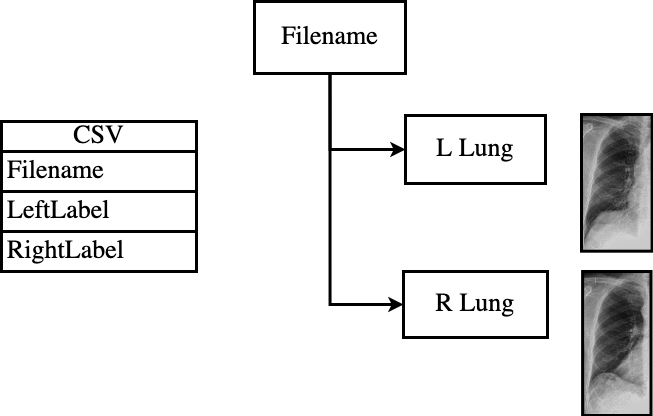

In [5]:
# train_df = pd.read_csv("../data/train_node_21.csv")
# test_df = pd.read_csv("../data/test_node_21.csv")
cxr14_train_df = pd.read_csv("../data/cxr14/train_cx14_node_21.csv")
jsrt_train_df = pd.read_csv("../data/jsrt/train_jsrt_node_21.csv")
pad_train_df = pd.read_csv("../data/padchest/train_pad_node_21.csv")

cxr14_test_df = pd.read_csv("../data/cxr14/test_cx14_node_21.csv")
jsrt_test_df = pd.read_csv("../data/jsrt/test_jsrt_node_21.csv")
pad_test_df = pd.read_csv("../data/padchest/test_pad_node_21.csv")
openi_test_df = pd.read_csv("../data/openi/test_openi_node_21.csv")

gold_train_df = pd.read_csv("../data/gold/gold_meta.csv")
# orig_data_path = "/Users/sophie/Downloads/node21_png_from_kaggle/"
orig_data_path = "/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images/"

In [6]:
# load segmentors
cxr_seg_alg = opencxr.load(opencxr.algorithms.lung_seg)
cxr_std_alg= opencxr.load(opencxr.algorithms.cxr_standardize)

algorithm [LungSegmentationAlgorithm] was created
algorithm [LungSegmentationAlgorithm] was created
algorithm [CXRStandardizationAlgorithm] was created


## Define Split Code

In [108]:
debug = None
if debug is None:
    print("no box")
else:
    print("box")
    
debug = train_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
if debug  is None:
    print("no box")
else:
    print("box")

no box
box


In [111]:
def process_and_export_split_cxr(img_name, label, train_test, load_dir,
                                 save_dir, cxr_seg_alg, cxr_std_alg, margin=2,
                                 std=True, arch_mask=False, lung_mask=False,
                                 flatten_base=False, out_size=1024, bbox=None):
    """
    Method to mask all tissue from the lung tissue outward.

    :param img_name: name image to be processed, string.
    :param label: label for image, string.
    :param train: label whether training, test or val, string.
    :param load_dir: path to where images to process are, string.
    :param save_dir: path for image export, child directories of configurations will be applied, string.
    :param cxr_seg_alg: opencxr lung segmentor object. 
    :param cxr_std_alg: opencxr cxr standardiser object.
    :param margin: apply margin to crop, int.
    :param std: apply opencxr image standardisation, boolean.
    :param arch_mask: apply arch segmentation, boolean.
    :param lung_mask: apply lung segmentation, boolean.
    :param flatten_base: make bottom of mask flat, boolean.
    """
    # throw exception if both masks are set to True
    if arch_mask and lung_mask:
        raise Exception(
            "Both mask options set to True. Please only specify one mask type \
            to use and try again.")

    # parse configs to pathname
    masking_process = "lung_seg" if lung_mask else "arch_seg" if arch_mask else "crop"
    std_process = "std" if std else "raw"
    base = "flattened" if flatten_base and arch_mask else "unflattened" if arch_mask else ""

    # save_out = os.path.join(save_dir,masking_process,base,std_process,str(out_size),train_test)

    if str(label) == "1":
        # nodule sample
        save_out = os.path.join(
            save_dir, "nodule", img_name.split(".")[0])  # +".png")
        if bbox is None:
            raise Exception(
                "Missing BBox! Nodule samples require BBox for shifting information.")
    elif str(label) == "0":
        # normal sample
        save_out = os.path.join(
            save_dir, "normal", img_name.split(".")[0])  # +".png")
    else:
        raise Exception(
            "Invalid label parameter. Please pass 1 or 0 as label.")

    # load image
    img_np, spacing, dcm_tags = read_file(os.path.join(load_dir, img_name))

    if std:
        # apply image standardisation
        img_np, spacing, std_size_changes = \
            cxr_std_alg.run(img_np, spacing, do_crop_to_lung_box=False)
    # make lung seg mask
    seg_img = cxr_seg_alg.run(img_np)

    if arch_mask:
        # use arch masking function
        out_img_np = processing.mask_outside_lungs(img_np, spacing, seg_img, margin, True, flatten_base)
        # crop
        out_img_np, out_crop_changes = processing.crop_to_mask(
            out_img_np, spacing, seg_img, margin)
        # out_img_np = out_img_np.T
    elif lung_mask:
        # mask from segmentor
        out_img_np = opencxr.utils.mask_crop.set_non_mask_constant(
            img_np, seg_img)
        out_img_np, out_crop_changes = processing.crop_to_mask(
            out_img_np, spacing, seg_img, margin)
        out_img_np = out_img_np.T
    else:
        # crop to seg
        out_img_np, out_crop_changes = processing.crop_to_mask(
            img_np, spacing, seg_img, margin)
        out_img_np = out_img_np.T
    # resize
    out_img_np, out_spacing, out_changes = opencxr.utils.resize_rescale.resize_to_x_y(
        out_img_np, spacing, out_size, out_size)

    # creating save path
    Path("/".join(save_out.split('/'))).mkdir(parents=True, exist_ok=True)

    if str(label) == "1":
        lung_l, lung_r, node_half, split_bbox = processing.split_to_lung_halves_with_box(
            out_img_np, seg_img, bbox)
    else:
        lung_l, lung_r = processing.split_to_lung_halves(out_img_np, seg_img)
        node_half, split_bbox = "None", [0, 0, 0, 0]
    # Log image processing
    with open(os.path.join(save_dir, "process_log.csv"), 'a+') as f:
        f.write(f"\n{img_name},{masking_process},{base},{std_process},{out_size},{train_test},{node_half},{split_bbox[0]},{split_bbox[1]},{split_bbox[2]},{split_bbox[3]}")

    cv2.imwrite(save_out+"/lung_l.png",
                ((lung_l/lung_l.max())*255).astype('int'))
    cv2.imwrite(save_out+"/lung_r.png",
                np.flip(((lung_r/lung_r.max())*255).astype('int'), axis=1))

    return lung_l, lung_r, spacing


## Create Split DS

In [ ]:
from IPython.display import clear_output

for i in range(0, len(train_df)):
    clear_output(wait=True)
    print(f"Processing image {i+1}/{len(train_df)} ...")
    ll, lr, ls = process_and_export_split_cxr(
        img_name=train_df.iloc[i]['mha'],
        label=train_df.iloc[i]['label'],
        train_test="train",
        load_dir=orig_data_path,
        save_dir="/Users/sophie/Downloads/split_node21_cropped/",
        cxr_seg_alg=cxr_seg_alg,
        cxr_std_alg=cxr_std_alg,
        margin=15,
        arch_mask=True,
        flatten_base=True,
        bbox=[train_df.iloc[i].orig_bbox_x,
              train_df.iloc[i].orig_bbox_y,
              train_df.iloc[i].orig_bbox_width,
              train_df.iloc[i].orig_bbox_height
             ]

    )

In [ ]:
from IPython.display import clear_output

for i in range(0, len(test_df)):
    clear_output(wait=True)
    print(f"Processing image {i+1}/{len(test_df)} ...")
    ll, lr, ls = process_and_export_split_cxr(
        img_name=test_df.iloc[i]['mha'],
        label=test_df.iloc[i]['label'],
        train_test="test",
        load_dir=orig_data_path,
        save_dir="/Users/sophie/Downloads/split_node21/",
        cxr_seg_alg=cxr_seg_alg,
        cxr_std_alg=cxr_std_alg,
        margin=15,
        arch_mask=True,
        flatten_base=True,
        bbox=[train_df.iloc[i].orig_bbox_x,
              train_df.iloc[i].orig_bbox_y,
              train_df.iloc[i].orig_bbox_width,
              train_df.iloc[i].orig_bbox_height
             ]

    )

Processing image 140/1107 ...


## Debugging crops

In [245]:
# i = 114
# i = 115
i = 1093

In [246]:
os.path.join(orig_data_path,test_df.iloc[i]['mha'])

'/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images/n0748.mha'

In [249]:
test_df.query(f"mha == '{test_df.iloc[i]['mha']}'")['mha'].values[0]

'n0748.mha'

In [250]:
# load image
# img_np, spacing, dcm_tags = read_file(os.path.join(load_dir, img_name))
img_np, spacing, dcm_tags = read_file(os.path.join(orig_data_path,test_df.query(f"mha == '{test_df.iloc[i]['mha']}'")['mha'].values[0]))

(-0.5, 1023.5, 1023.5, -0.5)

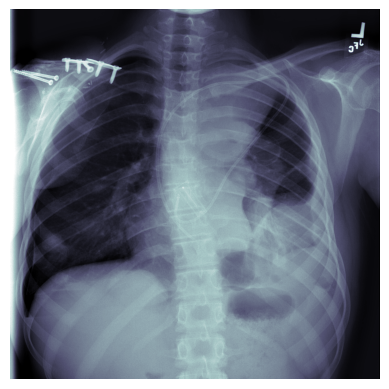

In [251]:
plt.imshow(img_np.T, cmap="bone")
plt.axis("off")

In [253]:
# apply image standardisation
std_img_np, spacing, std_size_changes = \
    cxr_std_alg.run(img_np, spacing, do_crop_to_lung_box=True)


1/1 [==============================] - 0s 384ms/step


(-0.5, 1023.5, 1023.5, -0.5)

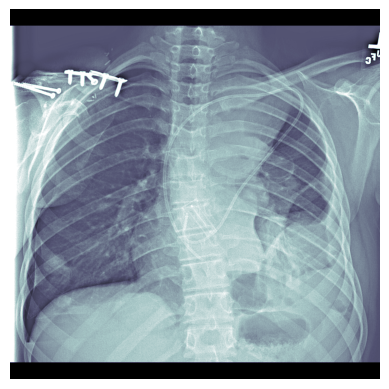

In [254]:
plt.imshow(std_img_np.T, cmap="bone")
plt.axis("off")

In [255]:
# make lung seg mask
seg_img = cxr_seg_alg.run(std_img_np)

1/1 [==============================] - 0s 439ms/step


(-0.5, 1023.5, 1023.5, -0.5)

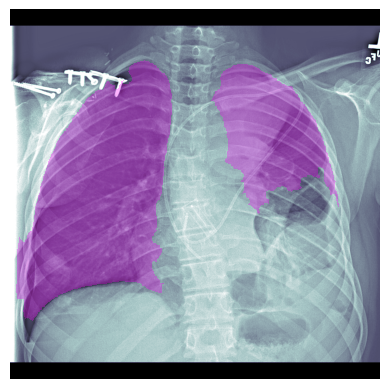

In [256]:
plt.imshow(std_img_np.T, cmap="bone")
lungs_only_mask = np.ma.masked_where(seg_img<0.9, seg_img) 
plt.imshow(lungs_only_mask.T, alpha=0.3, cmap="spring")
plt.axis("off")

In [257]:
tidy_seg = opencxr.algorithms.lungsegmentation.tidy_segmentation_mask(seg_img, 2)

(-0.5, 1023.5, 1023.5, -0.5)

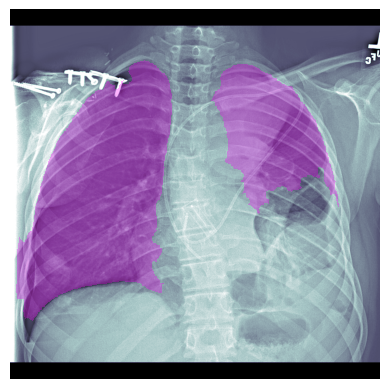

In [258]:
plt.imshow(std_img_np.T, cmap="bone")
tidy_lungs_only_mask = np.ma.masked_where(tidy_seg<0.9, tidy_seg)
plt.imshow(tidy_lungs_only_mask.T, alpha=0.3, cmap="spring")
plt.axis("off")

#### Cropped

In [259]:
out_img_np, out_crop_changes = processing.crop_to_mask(
        std_img_np, spacing, tidy_lungs_only_mask, 2)

out_seg_mask, _ = processing.crop_to_mask(tidy_lungs_only_mask,
                                          spacing,
                                          tidy_lungs_only_mask,
                                          2
                                         )

(-0.5, 926.5, 757.5, -0.5)

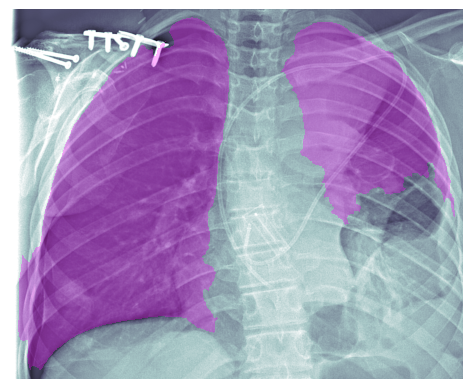

In [260]:
plt.imshow(out_img_np.T, cmap="bone")
plt.imshow(out_seg_mask.T, alpha=0.3, cmap="spring")
plt.axis("off")

#### Lung Seg

In [261]:
out_img_np = opencxr.utils.mask_crop.set_non_mask_constant(
        std_img_np, tidy_lungs_only_mask)

out_img_np, out_crop_changes = processing.crop_to_mask(
    out_img_np, spacing, tidy_lungs_only_mask, 2)


out_seg_mask, _ = processing.crop_to_mask(tidy_lungs_only_mask,
                                          spacing,
                                          tidy_lungs_only_mask,
                                          2
                                         )

(-0.5, 926.5, 757.5, -0.5)

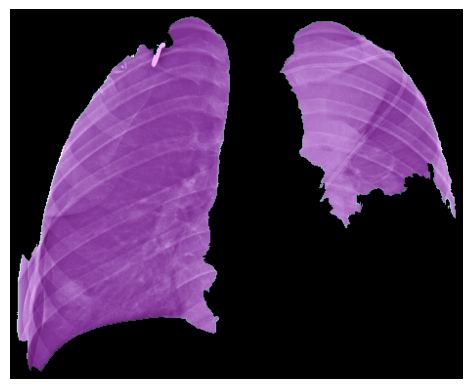

In [262]:
plt.imshow(out_img_np.T, cmap="bone")
plt.imshow(out_seg_mask.T, alpha=0.3, cmap="spring")
plt.axis("off")

#### Arch Seg

In [442]:
out_img_np = processing.mask_outside_lungs(std_img_np, spacing, 
                                           tidy_seg, 
                                           2, True, True)

out_seg_mask, _ = processing.crop_to_mask(tidy_lungs_only_mask,
                                          spacing,
                                          tidy_lungs_only_mask,
                                          2
                                         )

In [263]:
out_img_np = processing.mask_outside_lungs(std_img_np, spacing, 
                                           tidy_seg, 
                                           2, True, True)

out_seg_mask, _ = processing.crop_to_mask(tidy_lungs_only_mask,
                                          spacing,
                                          tidy_lungs_only_mask,
                                          2
                                         )

(-0.5, 926.5, 757.5, -0.5)

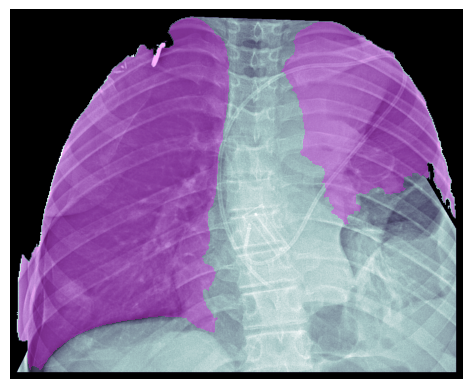

In [264]:
plt.imshow(out_img_np, cmap="bone")
plt.imshow(out_seg_mask.T, alpha=0.3, cmap="spring")
plt.axis("off")

#### Resizing

In [197]:
out_img_np, out_spacing, out_changes = opencxr.utils.resize_rescale.resize_to_x_y(
    out_img_np, spacing, 1024, 1024)

In [198]:
tidy_seg, _, _ = opencxr.utils.resize_rescale.resize_to_x_y(
    tidy_seg, spacing, 1024, 1024)

(-0.5, 1023.5, 1023.5, -0.5)

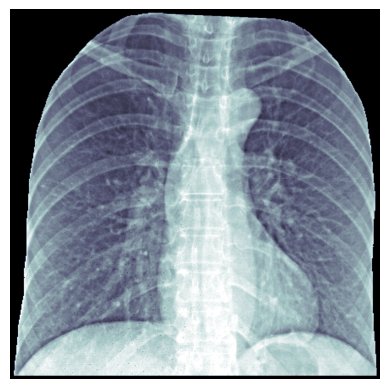

In [199]:
plt.imshow(out_img_np, cmap="bone")
plt.axis("off")

#### Splitting

In [265]:
lung_l, lung_r = processing.split_to_lung_halves(out_img_np.T, tidy_seg.T)

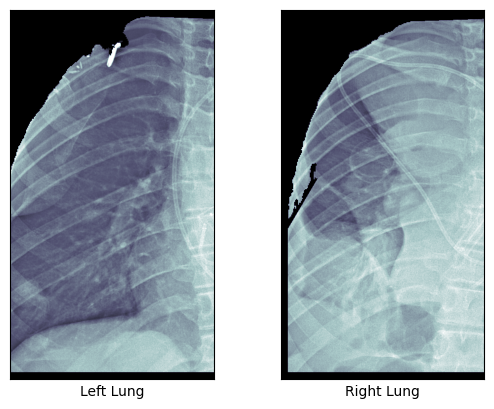

In [266]:
fig = plt.figure()
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lung_l,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)


Unwanted behaviour with splitting method. Let's revisit it.

In [267]:
# seperate lung masks
numLabels, labels, stats, centroids = \
    cv2.connectedComponentsWithStats(tidy_seg.T)
#drop row with max area (automatic label of full img generated by method)
stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
# calculate the left and right lung segments
l_stats, r_stats = stats[np.argmin(stats.T[0])],\
                    stats[np.argmax(stats.T[0])]
# identify inner lung points
l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
r_in = r_stats[cv2.CC_STAT_LEFT]
# lung centroid
lung_centroid = int(l_in + ((r_in-l_in)/2))

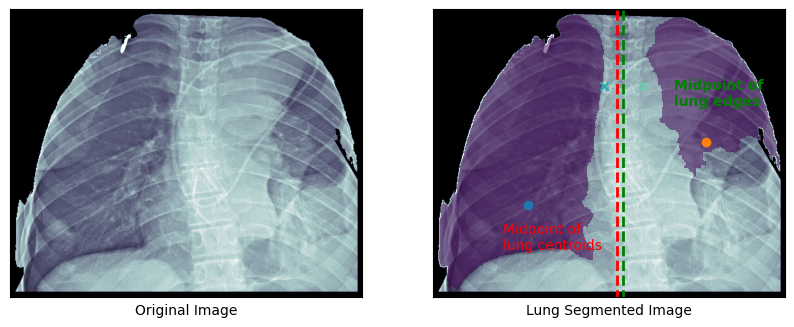

In [278]:
# group individual lung segments
num_labels, thresh_labels, stats_labels, centroids_labels=\
cv2.connectedComponentsWithStats(tidy_seg.T)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(out_img_np, cmap="bone")
ax.set_xlabel('Original Image')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)

plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
ax2.imshow(out_img_np, cmap="bone")
# msk_seg_orig_img= np.ma.masked_where(tidy_seg<0.9,tidy_seg)
msk_seg_orig_img = np.ma.masked_where(out_seg_mask<0.9, out_seg_mask)
ax2.imshow(msk_seg_orig_img.T,alpha=0.5)
ax2.tick_params(axis='both', which='both', length=0)
ax2.set_xlabel('Lung Segmented Image')
# plot central points of lung seg - skip [0] as it is center of bg
cp_x = []
for coord in list(centroids_labels[[1,2]]):
    cp_x.append(coord[0])
    ax2.scatter(x=[coord[0]],y=[coord[1]])
cp_x = np.asarray(cp_x)
cp_mid_x = ((cp_x.max()-cp_x.min())/2)+cp_x.min()
ax2.plot([cp_mid_x,cp_mid_x],[0,msk_seg_orig_img.T.shape[0]-1], color="red", linewidth=2,linestyle='dashed')
ax2.text(cp_mid_x-300,(msk_seg_orig_img.T.shape[0]/3)*2.5, "Midpoint of \nlung centroids", \
         fontdict={'color':  'red'})


# stats_labels[0]: bg.; stats_labels[1]: R lung; stats_labels[2]: L lung; 
# !!! Not consistent indices!!! will need to calculate max left_x index to determine right lung
if(stats_labels[1,cv2.CC_STAT_LEFT]>stats_labels[2,cv2.CC_STAT_LEFT]):
    ix_r_lung = 1
    ix_l_lung = 2
else:
    ix_r_lung = 2
    ix_l_lung = 1
    
r_lung_leftx = stats_labels[ix_r_lung,cv2.CC_STAT_LEFT]
ax2.scatter(x=[r_lung_leftx],y=[200],marker="x", color="mediumaquamarine")

l_lung_rightx = stats_labels[ix_l_lung,cv2.CC_STAT_LEFT]+stats_labels[ix_l_lung,cv2.CC_STAT_WIDTH]
ax2.scatter(x=[l_lung_rightx],y=[200],marker="x", color="lightseagreen")

lung_edge_dist_x = r_lung_leftx - l_lung_rightx

cp_edge_x = r_lung_leftx-(lung_edge_dist_x/2)


ax2.plot([cp_edge_x,cp_edge_x],[0,msk_seg_orig_img.T.shape[0]-1], color="green", linewidth=2,linestyle='dashed')
ax2.text(cp_mid_x+150,(msk_seg_orig_img.T.shape[0]/3), "Midpoint of \nlung edges", \
         fontdict={'color':  'green','weight':"heavy"})

plt.show()

In [279]:
stats.T[0]

array([ 14, 552], dtype=int32)

In [280]:
img_np.shape[0]

1024

In [281]:
crop_x_len = max(int(img_np.shape[0]-lung_centroid),\
                 int(0+lung_centroid))

In [472]:
def temp_split_to_lung_halves(img_np, seg_result):
    """
    A method split image into two halves, using the midpoint between the
    innermost x coordinates of each lung.

    :param img_np: the original image
    :param seg_result: the segmentation mask of the lungs
    :return: Left and right lung image halves with same dimensions
    """
    # seperate lung masks
    numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
    #drop row with max area (automatic label of full img generated by method)
    stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
    # calculate the left and right lung segments
    l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
    # identify inner lung points
    l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
    r_in = r_stats[cv2.CC_STAT_LEFT]
    # lung centroid
    lung_centroid = int(l_in + ((r_in-l_in)/2))
    # crop dims - widest
    crop_x_len = min(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))
    return img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T,\
           np.flip(img_np[lung_centroid:min(int(lung_centroid+crop_x_len),img_np.shape[0]),0:img_np.shape[1]].T, axis=1)
def stretch_split_to_lung_halves(img_np, seg_result):
    """
    A method split image into two halves, using the midpoint between the
    innermost x coordinates of each lung.

    :param img_np: the original image
    :param seg_result: the segmentation mask of the lungs
    :return: Left and right lung image halves with same dimensions
    """
    # seperate lung masks
    numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
    #drop row with max area (automatic label of full img generated by method)
    stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
    # calculate the left and right lung segments
    l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
    # identify inner lung points
    l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
    r_in = r_stats[cv2.CC_STAT_LEFT]
    # lung centroid
    lung_centroid = int(l_in + ((r_in-l_in)/2))
    # crop dims - widest
    crop_x_len = max(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))

    # Create the initial crops
    # left_half = img_np[int(lung_centroid-crop_x_len):lung_centroid,0:img_np.shape[1]].T
    left_half = img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T

    right_half = img_np[lung_centroid:int(lung_centroid+crop_x_len),0:img_np.shape[1]].T
    
    # Get actual widths of each half
    left_width = left_half.shape[1]
    right_width = right_half.shape[1]
    
    # Determine target width (the wider of the two)
    target_width = max(left_width, right_width)
    
    # Resize the narrower half to match the wider one
    if left_width < target_width:
        left_half = cv2.resize(left_half, (target_width, left_half.shape[0]), interpolation=cv2.INTER_LINEAR)
    elif right_width < target_width:
        right_half = cv2.resize(right_half, (target_width, right_half.shape[0]), interpolation=cv2.INTER_LINEAR)
    return left_half, np.flip(right_half, axis=1)

In [408]:
stretch_lung_l, stretch_lung_r = stretch_split_to_lung_halves(out_img_np.T, tidy_seg.T)

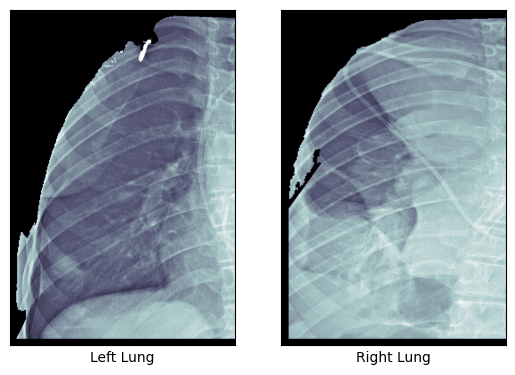

In [409]:
fig = plt.figure()
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(stretch_lung_l,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(stretch_lung_r, axis=1),cmap="bone")
ax2.imshow(stretch_lung_r,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

In [410]:
lung_l, lung_r = temp_split_to_lung_halves(out_img_np.T, tidy_seg.T)

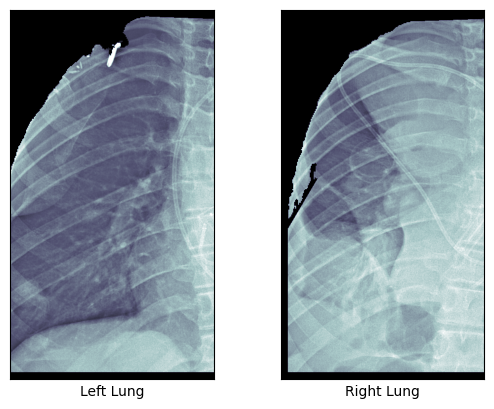

In [411]:
fig = plt.figure()
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lung_l,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(lung_r,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

In [412]:
from skimage.metrics import structural_similarity as ssim
import numpy as np
import cv2

left_half, right_half = lung_l, lung_r

# SSIM
ssim_score = ssim(left_half, right_half, data_range=left_half.max() - left_half.min())
print(f"SSIM: {ssim_score}")
# NCC
# ncc = cv2.matchTemplate(left_half, right_half, cv2.TM_CCORR_NORMED)[0,0]

# MAE
mae = np.mean(np.abs(left_half - right_half))
print(f"MAE: {mae}")

# MSE and PSNR
mse = np.mean((left_half - right_half) ** 2)
print(f"MSE: {mse}")
psnr = 20 * np.log10(255.0 / np.sqrt(mse))  # assuming 8-bit images
print(f"PSNR: {psnr}")

SSIM: 0.4394036667956034
MAE: 43608.42187953693
MSE: 25356.28832485387
PSNR: 4.089946794030444


In [413]:
left_half, right_half = stretch_lung_l, stretch_lung_r

# SSIM
ssim_score = ssim(left_half, right_half, data_range=left_half.max() - left_half.min())
print(f"SSIM: {ssim_score}")
# NCC
# ncc = cv2.matchTemplate(left_half, right_half, cv2.TM_CCORR_NORMED)[0,0]

# MAE
mae = np.mean(np.abs(left_half - right_half))
print(f"MAE: {mae}")

# MSE and PSNR
mse = np.mean((left_half - right_half) ** 2)
print(f"MSE: {mse}")
psnr = 20 * np.log10(255.0 / np.sqrt(mse))  # assuming 8-bit images
print(f"PSNR: {psnr}")

SSIM: 0.4476303446232996
MAE: 44379.294203026264
MSE: 24888.03741621784
PSNR: 4.170897098564337


In [414]:
import numpy as np
import cv2
from skimage.metrics import structural_similarity as ssim
from scipy.stats import pearsonr

def calculate_lung_similarity(left_half, right_half):
    """
    Calculate various similarity metrics between left and right lung halves
    """
    # Ensure both images have the same shape
    if left_half.shape != right_half.shape:
        raise ValueError("Images must have the same dimensions")
    
    # Convert to grayscale if needed
    if len(left_half.shape) == 3:
        left_gray = cv2.cvtColor(left_half, cv2.COLOR_BGR2GRAY)
        right_gray = cv2.cvtColor(right_half, cv2.COLOR_BGR2GRAY)
    else:
        left_gray = left_half.copy()
        right_gray = right_half.copy()
    
    # Ensure proper data types for OpenCV functions
    left_8u = left_gray.astype(np.uint8)
    right_8u = right_gray.astype(np.uint8)
    left_32f = left_gray.astype(np.float32)
    right_32f = right_gray.astype(np.float32)
    
    results = {}
    
    # 1. SSIM (Structural Similarity Index)
    try:
        ssim_score = ssim(left_gray, right_gray, data_range=left_gray.max() - left_gray.min())
        results['SSIM'] = ssim_score
    except Exception as e:
        results['SSIM'] = f"Error: {e}"
    
    # 2. Normalized Cross-Correlation (Fixed)
    try:
        # Method 1: Using matchTemplate with proper types
        if left_8u.shape == right_8u.shape:
            ncc_result = cv2.matchTemplate(left_8u, right_8u, cv2.TM_CCORR_NORMED)
            ncc_score = ncc_result[0, 0]
        else:
            # Alternative: Manual NCC calculation
            ncc_score = manual_ncc(left_gray, right_gray)
        results['NCC'] = ncc_score
    except Exception as e:
        # Fallback to manual calculation
        results['NCC'] = manual_ncc(left_gray, right_gray)
    
    # 3. Pearson Correlation Coefficient
    try:
        corr_coef, _ = pearsonr(left_gray.flatten(), right_gray.flatten())
        results['Pearson_Correlation'] = corr_coef
    except Exception as e:
        results['Pearson_Correlation'] = f"Error: {e}"
    
    # 4. Mean Absolute Error
    mae = np.mean(np.abs(left_gray.astype(np.float32) - right_gray.astype(np.float32)))
    results['MAE'] = mae
    
    # 5. Mean Squared Error
    mse = np.mean((left_gray.astype(np.float32) - right_gray.astype(np.float32)) ** 2)
    results['MSE'] = mse
    
    # 6. Peak Signal-to-Noise Ratio
    if mse > 0:
        max_pixel = 255.0 if left_gray.max() <= 255 else left_gray.max()
        psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
        results['PSNR'] = psnr
    else:
        results['PSNR'] = float('inf')  # Perfect match
    
    # 7. Cosine Similarity
    left_flat = left_gray.flatten().astype(np.float32)
    right_flat = right_gray.flatten().astype(np.float32)
    
    dot_product = np.dot(left_flat, right_flat)
    norm_left = np.linalg.norm(left_flat)
    norm_right = np.linalg.norm(right_flat)
    
    if norm_left > 0 and norm_right > 0:
        cosine_sim = dot_product / (norm_left * norm_right)
        results['Cosine_Similarity'] = cosine_sim
    else:
        results['Cosine_Similarity'] = 0.0
    
    # 8. Histogram Correlation
    try:
        hist1 = cv2.calcHist([left_8u], [0], None, [256], [0, 256])
        hist2 = cv2.calcHist([right_8u], [0], None, [256], [0, 256])
        hist_corr = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
        results['Histogram_Correlation'] = hist_corr
    except Exception as e:
        results['Histogram_Correlation'] = f"Error: {e}"
    
    # 9. Mutual Information (approximation)
    try:
        mi = mutual_information(left_gray, right_gray)
        results['Mutual_Information'] = mi
    except Exception as e:
        results['Mutual_Information'] = f"Error: {e}"
    
    return results

def manual_ncc(img1, img2):
    """Manual implementation of Normalized Cross-Correlation"""
    img1 = img1.astype(np.float32)
    img2 = img2.astype(np.float32)
    
    # Subtract means
    img1_centered = img1 - np.mean(img1)
    img2_centered = img2 - np.mean(img2)
    
    # Calculate correlation
    numerator = np.sum(img1_centered * img2_centered)
    denominator = np.sqrt(np.sum(img1_centered**2) * np.sum(img2_centered**2))
    
    if denominator == 0:
        return 0.0
    
    return numerator / denominator

def mutual_information(img1, img2, bins=256):
    """Calculate mutual information between two images"""
    # Convert to integers for histogram
    img1_int = ((img1 - img1.min()) / (img1.max() - img1.min()) * (bins - 1)).astype(int)
    img2_int = ((img2 - img2.min()) / (img2.max() - img2.min()) * (bins - 1)).astype(int)
    
    # Joint histogram
    joint_hist = np.histogram2d(img1_int.flatten(), img2_int.flatten(), bins=bins)[0]
    
    # Marginal histograms
    hist1 = np.histogram(img1_int, bins=bins)[0]
    hist2 = np.histogram(img2_int, bins=bins)[0]
    
    # Normalize to probabilities
    joint_prob = joint_hist / np.sum(joint_hist)
    prob1 = hist1 / np.sum(hist1)
    prob2 = hist2 / np.sum(hist2)
    
    # Calculate mutual information
    mi = 0.0
    for i in range(bins):
        for j in range(bins):
            if joint_prob[i, j] > 0 and prob1[i] > 0 and prob2[j] > 0:
                mi += joint_prob[i, j] * np.log2(joint_prob[i, j] / (prob1[i] * prob2[j]))
    
    return mi


In [415]:
print("Max Crop")
similarity_results = calculate_lung_similarity(lung_l, lung_r)
print("Similarity Metrics:")
for metric, value in similarity_results.items():
    print(f"{metric}: {value}")

Max Crop
Similarity Metrics:
SSIM: 0.4394036667956034
NCC: 0.7268849015235901
Pearson_Correlation: 0.7439631065774372
MAE: 614.874267578125
MSE: 723667.5625
PSNR: 13.649687767028809
Cosine_Similarity: 0.9488347172737122
Histogram_Correlation: 0.9998258765489396
Mutual_Information: 0.6860131060873079


In [416]:
print("Stretch Crop")
similarity_results = calculate_lung_similarity(stretch_lung_l, stretch_lung_r)
print("Similarity Metrics:")
for metric, value in similarity_results.items():
    print(f"{metric}: {value}")

Stretch Crop
Similarity Metrics:
SSIM: 0.4476303446232996
NCC: 0.7121865749359131
Pearson_Correlation: 0.7274343791893646
MAE: 721.6898193359375
MSE: 1024901.8125
PSNR: 12.138255834579468
Cosine_Similarity: 0.9278659820556641
Histogram_Correlation: 0.9999424120827473
Mutual_Information: 0.6622913771776


In [417]:
import numpy as np
import cv2
from skimage.metrics import structural_similarity as ssim
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from scipy.stats import pearsonr, wasserstein_distance
from scipy.spatial.distance import cdist

def calculate_lung_similarity(left_half, right_half):
    """
    Calculate various similarity metrics between left and right lung halves
    """
    # Ensure both images have the same shape
    if left_half.shape != right_half.shape:
        raise ValueError("Images must have the same dimensions")
    
    # Convert to grayscale if needed
    if len(left_half.shape) == 3:
        left_gray = cv2.cvtColor(left_half, cv2.COLOR_BGR2GRAY)
        right_gray = cv2.cvtColor(right_half, cv2.COLOR_BGR2GRAY)
    else:
        left_gray = left_half.copy()
        right_gray = right_half.copy()
    
    # Ensure proper data types for OpenCV functions
    left_8u = left_gray.astype(np.uint8)
    right_8u = right_gray.astype(np.uint8)
    left_32f = left_gray.astype(np.float32)
    right_32f = right_gray.astype(np.float32)
    
    results = {}
    
    # 1. Histogram Correlation
    try:
        hist1 = cv2.calcHist([left_8u], [0], None, [256], [0, 256])
        hist2 = cv2.calcHist([right_8u], [0], None, [256], [0, 256])
        hist_corr = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
        results['Histogram_Correlation'] = hist_corr
    except Exception as e:
        results['Histogram_Correlation'] = f"Error: {e}"
        
    # 2. Local Binary Pattern (LBP) similarity
    try:
        lbp_sim = lbp_similarity(left_gray, right_gray)
        results['LBP_Texture_Similarity'] = lbp_sim
    except Exception as e:
        results['LBP_Texture_Similarity'] = f"Error: {e}"
    
    # 3. EMD on histograms
    try:
        hist1 = np.histogram(left_gray, bins=256, range=(0, 255), density=True)[0]
        hist2 = np.histogram(right_gray, bins=256, range=(0, 255), density=True)[0]
        emd_hist = wasserstein_distance(range(256), range(256), hist1, hist2)
        results['EMD_Histograms'] = emd_hist
    except Exception as e:
        results['EMD_Histograms'] = f"Error: {e}"
    # 4. Gray-Level Co-occurrence Matrix (GLCM) features
    try:
        glcm_sim = glcm_similarity(left_gray, right_gray)
        results['GLCM_Texture_Similarity'] = glcm_sim
    except Exception as e:
        results['GLCM_Texture_Similarity'] = f"Error: {e}"
    
    # 5. Mutual Information (approximation)
    try:
        mi = mutual_information(left_gray, right_gray)
        results['Mutual_Information'] = mi
    except Exception as e:
        results['Mutual_Information'] = f"Error: {e}"
    
    # 6. Gradient magnitude similarity (edge/texture patterns)
    try:
        grad_sim = gradient_similarity(left_gray, right_gray)
        results['Gradient_Similarity'] = grad_sim
    except Exception as e:
        results['Gradient_Similarity'] = f"Error: {e}"
    
    # 7. Variance similarity (texture roughness)
    try:
        var_sim = variance_similarity(left_gray, right_gray)
        results['Variance_Similarity'] = var_sim
    except Exception as e:
        results['Variance_Similarity'] = f"Error: {e}"
    
#     # 1. SSIM (Structural Similarity Index)
#     try:
#         ssim_score = ssim(left_gray, right_gray, data_range=left_gray.max() - left_gray.min())
#         results['SSIM'] = ssim_score
#     except Exception as e:
#         results['SSIM'] = f"Error: {e}"
    
#     # 2. Normalized Cross-Correlation (Fixed)
#     try:
#         # Method 1: Using matchTemplate with proper types
#         if left_8u.shape == right_8u.shape:
#             ncc_result = cv2.matchTemplate(left_8u, right_8u, cv2.TM_CCORR_NORMED)
#             ncc_score = ncc_result[0, 0]
#         else:
#             # Alternative: Manual NCC calculation
#             ncc_score = manual_ncc(left_gray, right_gray)
#         results['NCC'] = ncc_score
#     except Exception as e:
#         # Fallback to manual calculation
#         results['NCC'] = manual_ncc(left_gray, right_gray)
    
#     # 3. Pearson Correlation Coefficient
#     try:
#         corr_coef, _ = pearsonr(left_gray.flatten(), right_gray.flatten())
#         results['Pearson_Correlation'] = corr_coef
#     except Exception as e:
#         results['Pearson_Correlation'] = f"Error: {e}"
    
#     # 4. Mean Absolute Error
#     mae = np.mean(np.abs(left_gray.astype(np.float32) - right_gray.astype(np.float32)))
#     results['MAE'] = mae
    
#     # 5. Mean Squared Error
#     mse = np.mean((left_gray.astype(np.float32) - right_gray.astype(np.float32)) ** 2)
#     results['MSE'] = mse
    
#     # 6. Peak Signal-to-Noise Ratio
#     if mse > 0:
#         max_pixel = 255.0 if left_gray.max() <= 255 else left_gray.max()
#         psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
#         results['PSNR'] = psnr
#     else:
#         results['PSNR'] = float('inf')  # Perfect match
    
#     # 7. Cosine Similarity
#     left_flat = left_gray.flatten().astype(np.float32)
#     right_flat = right_gray.flatten().astype(np.float32)
    
#     dot_product = np.dot(left_flat, right_flat)
#     norm_left = np.linalg.norm(left_flat)
#     norm_right = np.linalg.norm(right_flat)
    
#     if norm_left > 0 and norm_right > 0:
#         cosine_sim = dot_product / (norm_left * norm_right)
#         results['Cosine_Similarity'] = cosine_sim
#     else:
#         results['Cosine_Similarity'] = 0.0
    
    
    
#     # 9. Mutual Information (approximation)
#     try:
#         mi = mutual_information(left_gray, right_gray)
#         results['Mutual_Information'] = mi
#     except Exception as e:
#         results['Mutual_Information'] = f"Error: {e}"
    
#     # 10. Earth Mover's Distance (Wasserstein Distance)
#     try:
#         # Method 1: 1D EMD on pixel intensities
#         emd_1d = wasserstein_distance(left_gray.flatten(), right_gray.flatten())
#         results['EMD_1D_Intensities'] = emd_1d
        
#         # Method 2: EMD on histograms
#         hist1 = np.histogram(left_gray, bins=256, range=(0, 255), density=True)[0]
#         hist2 = np.histogram(right_gray, bins=256, range=(0, 255), density=True)[0]
#         emd_hist = wasserstein_distance(range(256), range(256), hist1, hist2)
#         results['EMD_Histograms'] = emd_hist
        
#         # Method 3: 2D EMD (spatial distribution) - Less relevant for your use case
#         emd_2d = earth_movers_distance_2d(left_gray, right_gray)
#         results['EMD_2D_Spatial'] = emd_2d
        
#     except Exception as e:
#         results['EMD_1D_Intensities'] = f"Error: {e}"
#         results['EMD_Histograms'] = f"Error: {e}"
#         results['EMD_2D_Spatial'] = f"Error: {e}"
    
#     # 11. Texture-based similarity metrics
#     try:
#         # Local Binary Pattern (LBP) similarity
#         lbp_sim = lbp_similarity(left_gray, right_gray)
#         results['LBP_Texture_Similarity'] = lbp_sim
        
#         # Gray-Level Co-occurrence Matrix (GLCM) features
#         glcm_sim = glcm_similarity(left_gray, right_gray)
#         results['GLCM_Texture_Similarity'] = glcm_sim
        
#         # Gradient magnitude similarity (edge/texture patterns)
#         grad_sim = gradient_similarity(left_gray, right_gray)
#         results['Gradient_Similarity'] = grad_sim
        
#         # Variance similarity (texture roughness)
#         var_sim = variance_similarity(left_gray, right_gray)
#         results['Variance_Similarity'] = var_sim
        
#     except Exception as e:
#         results['LBP_Texture_Similarity'] = f"Error: {e}"
#         results['GLCM_Texture_Similarity'] = f"Error: {e}"
#         results['Gradient_Similarity'] = f"Error: {e}"
#         results['Variance_Similarity'] = f"Error: {e}"
    
    return results

def manual_ncc(img1, img2):
    """Manual implementation of Normalized Cross-Correlation"""
    img1 = img1.astype(np.float32)
    img2 = img2.astype(np.float32)
    
    # Subtract means
    img1_centered = img1 - np.mean(img1)
    img2_centered = img2 - np.mean(img2)
    
    # Calculate correlation
    numerator = np.sum(img1_centered * img2_centered)
    denominator = np.sqrt(np.sum(img1_centered**2) * np.sum(img2_centered**2))
    
    if denominator == 0:
        return 0.0
    
    return numerator / denominator

def mutual_information(img1, img2, bins=256):
    """Calculate mutual information between two images"""
    # Normalise intensities
    # Convert to integers for histogram
    img1_int = ((img1 - img1.min()) / (img1.max() - img1.min()) * (bins - 1)).astype(int)
    img2_int = ((img2 - img2.min()) / (img2.max() - img2.min()) * (bins - 1)).astype(int)
    
    # Joint histogram
    # pixel count where both halves have the same intensity
    joint_hist = np.histogram2d(img1_int.flatten(), img2_int.flatten(), bins=bins)[0]
    
    # Marginal histograms
    # individual distributions
    hist1 = np.histogram(img1_int, bins=bins)[0]
    hist2 = np.histogram(img2_int, bins=bins)[0]
    
    # Normalize to probabilities
    # -> sum to 1
    joint_prob = joint_hist / np.sum(joint_hist)
    prob1 = hist1 / np.sum(hist1)
    prob2 = hist2 / np.sum(hist2)
    
    # Calculate mutual information
    mi = 0.0
    for i in range(bins):
        for j in range(bins):
            if joint_prob[i, j] > 0 and prob1[i] > 0 and prob2[j] > 0:
                mi += joint_prob[i, j] * np.log2(joint_prob[i, j] / (prob1[i] * prob2[j]))
    
    return mi

def lbp_similarity(img1, img2, radius=3, n_points=24):
    """
    Calculate texture similarity using Local Binary Patterns (LBP)
    LBP captures local texture patterns independent of overall brightness
    """
    # Calculate LBP for both images
    lbp1 = local_binary_pattern(img1, n_points, radius, method='uniform')
    lbp2 = local_binary_pattern(img2, n_points, radius, method='uniform')
    
    # Create histograms of LBP patterns
    hist1, _ = np.histogram(lbp1.flatten(), bins=n_points + 2, range=(0, n_points + 2), density=True)
    hist2, _ = np.histogram(lbp2.flatten(), bins=n_points + 2, range=(0, n_points + 2), density=True)
    
    # Calculate correlation between histograms
    correlation = np.corrcoef(hist1, hist2)[0, 1]
    return correlation if not np.isnan(correlation) else 0.0

def glcm_similarity(img1, img2, distances=[1], angles=[0, 45, 90, 135]):
    """
    Calculate texture similarity using Gray-Level Co-occurrence Matrix (GLCM)
    GLCM captures spatial relationships in texture patterns
    """
    # Convert angles to radians
    angles_rad = [np.radians(angle) for angle in angles]
    
    # Calculate GLCM properties for both images
    def get_glcm_features(img):
        # Quantize image to reduce computation
        img_quantized = (img / (img.max() / 63)).astype(np.uint8)
        
        # Calculate GLCM
        glcm = graycomatrix(img_quantized, distances, angles_rad, levels=64, symmetric=True, normed=True)
        
        # Extract texture features
        contrast = graycoprops(glcm, 'contrast').mean()
        dissimilarity = graycoprops(glcm, 'dissimilarity').mean()
        homogeneity = graycoprops(glcm, 'homogeneity').mean()
        energy = graycoprops(glcm, 'energy').mean()
        
        return np.array([contrast, dissimilarity, homogeneity, energy])
    
    features1 = get_glcm_features(img1)
    features2 = get_glcm_features(img2)
    
    # Calculate similarity (inverse of normalized difference)
    feature_diff = np.abs(features1 - features2)
    max_diff = np.maximum(features1, features2)
    normalized_diff = np.divide(feature_diff, max_diff, out=np.zeros_like(feature_diff), where=max_diff!=0)
    
    similarity = 1 - np.mean(normalized_diff)
    return similarity

def gradient_similarity(img1, img2):
    """
    Calculate similarity based on gradient magnitudes (edge/texture patterns)
    """
    # Calculate gradients
    grad1_x = cv2.Sobel(img1, cv2.CV_64F, 1, 0, ksize=3)
    grad1_y = cv2.Sobel(img1, cv2.CV_64F, 0, 1, ksize=3)
    grad1_mag = np.sqrt(grad1_x**2 + grad1_y**2)
    
    grad2_x = cv2.Sobel(img2, cv2.CV_64F, 1, 0, ksize=3)
    grad2_y = cv2.Sobel(img2, cv2.CV_64F, 0, 1, ksize=3)
    grad2_mag = np.sqrt(grad2_x**2 + grad2_y**2)
    
    # Calculate correlation between gradient magnitudes
    correlation = np.corrcoef(grad1_mag.flatten(), grad2_mag.flatten())[0, 1]
    return correlation if not np.isnan(correlation) else 0.0

def variance_similarity(img1, img2, window_size=5):
    """
    Calculate similarity based on local variance (texture roughness)
    """
    # Calculate local variance using a sliding window
    kernel = np.ones((window_size, window_size), np.float32) / (window_size * window_size)
    
    # Local means
    mean1 = cv2.filter2D(img1.astype(np.float32), -1, kernel)
    mean2 = cv2.filter2D(img2.astype(np.float32), -1, kernel)
    
    # Local variances
    var1 = cv2.filter2D((img1.astype(np.float32) - mean1)**2, -1, kernel)
    var2 = cv2.filter2D((img2.astype(np.float32) - mean2)**2, -1, kernel)
    
    # Calculate correlation between local variances
    correlation = np.corrcoef(var1.flatten(), var2.flatten())[0, 1]
    return correlation if not np.isnan(correlation) else 0.0

def earth_movers_distance_2d(img1, img2, downsample_factor=4):
    """
    Calculate 2D Earth Mover's Distance between two images
    considering spatial distribution of pixel intensities
    
    Args:
        img1, img2: Input images
        downsample_factor: Factor to downsample images for computational efficiency
    """
    # Downsample images for computational efficiency
    h1, w1 = img1.shape[0] // downsample_factor, img1.shape[1] // downsample_factor
    h2, w2 = img2.shape[0] // downsample_factor, img2.shape[1] // downsample_factor
    
    img1_small = cv2.resize(img1, (w1, h1))
    img2_small = cv2.resize(img2, (w2, h2))
    
    # Create coordinate grids
    y1, x1 = np.meshgrid(np.arange(h1), np.arange(w1), indexing='ij')
    y2, x2 = np.meshgrid(np.arange(h2), np.arange(w2), indexing='ij')
    
    # Flatten and create distributions
    points1 = np.column_stack([x1.flatten(), y1.flatten()])
    points2 = np.column_stack([x2.flatten(), y2.flatten()])
    
    weights1 = img1_small.flatten().astype(np.float64)
    weights2 = img2_small.flatten().astype(np.float64)
    
    # Normalize weights to sum to 1
    weights1 = weights1 / np.sum(weights1) if np.sum(weights1) > 0 else np.ones_like(weights1) / len(weights1)
    weights2 = weights2 / np.sum(weights2) if np.sum(weights2) > 0 else np.ones_like(weights2) / len(weights2)
    
    # Calculate distance matrix
    distance_matrix = cdist(points1, points2, metric='euclidean')
    
    # Solve EMD using approximation (since exact EMD is computationally expensive)
    # This is a simplified approximation - for exact EMD, you'd need optimization libraries
    emd_approx = approximate_emd(weights1, weights2, distance_matrix)
    
    return emd_approx

def approximate_emd(weights1, weights2, distance_matrix):
    """
    Approximate Earth Mover's Distance using a simplified greedy approach
    For exact EMD, consider using libraries like POT (Python Optimal Transport)
    """
    try:
        # Simple approximation: weighted average of distances
        total_distance = 0.0
        total_weight = 0.0
        
        for i in range(len(weights1)):
            for j in range(len(weights2)):
                weight = min(weights1[i], weights2[j])
                total_distance += weight * distance_matrix[i, j]
                total_weight += weight
        
        return total_distance / total_weight if total_weight > 0 else 0.0
    
    except Exception:
        # Fallback: average minimum distance
        return np.mean(np.min(distance_matrix, axis=1))

# Example usage:
# similarity_results = calculate_lung_similarity(left_half, right_half)
# print("Similarity Metrics:")
# for metric, value in similarity_results.items():
#     print(f"{metric}: {value}")

# Additional utility function for more precise EMD (requires POT library)
def precise_emd_with_pot(img1, img2):
    """
    More precise EMD calculation using Python Optimal Transport (POT) library
    Install with: pip install POT
    
    Uncomment and use this if you need exact EMD calculation
    """
    # import ot
    # 
    # # Prepare distributions
    # hist1 = np.histogram(img1, bins=256, range=(0, 255), density=True)[0]
    # hist2 = np.histogram(img2, bins=256, range=(0, 255), density=True)[0]
    # 
    # # Distance matrix (for histogram bins)
    # M = np.abs(np.arange(256)[:, None] - np.arange(256)[None, :])
    # 
    # # Compute EMD
    # emd_value = ot.emd2(hist1, hist2, M)
    # 
    # return emd_value
    pass

In [315]:
print("Stretch Crop")
similarity_results = calculate_lung_similarity(stretch_lung_l, stretch_lung_r)
print("Similarity Metrics:")
for metric, value in similarity_results.items():
    print(f"{metric}: {value}")

Stretch Crop
Similarity Metrics:
SSIM: 0.29560587704369823
NCC: 0.6060957908630371
Pearson_Correlation: 0.021518528657654155
MAE: 1260.548095703125
MSE: 2754792.0
PSNR: 7.844189405441284
Cosine_Similarity: 0.7561270594596863
Histogram_Correlation: 0.9999424120827473
Mutual_Information: 0.23204716295101943
EMD_1D_Intensities: 595.6227638652022
EMD_Histograms: 0.7418924589381345
EMD_2D_Spatial: 77.8131158231456
LBP_Texture_Similarity: 0.980981625763466
GLCM_Texture_Similarity: 0.8699327663644848
Gradient_Similarity: 0.22596896308227396
Variance_Similarity: 0.20366452168307553


In [418]:
print("Stretch Crop")
similarity_results = calculate_lung_similarity(stretch_lung_l, stretch_lung_r)
print("Similarity Metrics:")
for metric, value in similarity_results.items():
    print(f"{metric}: {value}")

Stretch Crop
Similarity Metrics:
Histogram_Correlation: 0.9999424120827473
LBP_Texture_Similarity: 0.980981625763466
EMD_Histograms: 0.7418924589381345
GLCM_Texture_Similarity: 0.8699327663644848
Mutual_Information: 0.6622913771776
Gradient_Similarity: 0.2818032862545866
Variance_Similarity: 0.2918193234277953


In [419]:
print("Max Crop")
similarity_results = calculate_lung_similarity(lung_l, lung_r)
print("Similarity Metrics:")
for metric, value in similarity_results.items():
    print(f"{metric}: {value}")

Max Crop
Similarity Metrics:
Histogram_Correlation: 0.9998258765489396
LBP_Texture_Similarity: 0.9988963262247644
EMD_Histograms: 0.0
GLCM_Texture_Similarity: 0.8727980334154921
Mutual_Information: 0.6860131060873079
Gradient_Similarity: 0.32363191565800603
Variance_Similarity: 0.292555026010234


### Run Similarities Over Train DF

In [463]:
pd.DataFrame.from_dict(result_array)

,Histogram_Correlation,LBP_Texture_Similarity,EMD_Histograms,GLCM_Texture_Similarity,Mutual_Information,Gradient_Similarity,Variance_Similarity,Process,Crop,Image
0,-0.058603,0.999840,Error: Weight array-like sum must be positive ...,0.938395,0.740850,0.054240,0.007383,crop,Max,n0814.mha
1,0.038005,0.999242,Error: Weight array-like sum must be positive ...,0.852531,0.703332,0.059425,0.009603,crop,Stretch,n0814.mha
2,0.999991,0.985276,0.0,0.821695,0.613005,0.046415,0.005054,seg,Max,n0814.mha
3,0.999993,0.989601,0.108505,0.767691,0.654914,0.081750,0.087015,seg,Stretch,n0814.mha
4,0.999773,0.972153,0.0,0.820370,1.090185,0.384580,0.398811,arch,Max,n0814.mha
5,0.999903,0.998219,0.065114,0.883833,1.212385,0.392032,0.472546,arch,Stretch,n0814.mha


In [502]:
df = train_df
result_array = []
for i in range(0, len(df)):
    # load image
    img_np, spacing, dcm_tags = read_file(os.path.join(orig_data_path,df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]))
    # standardise image
    std_img_np, spacing, std_size_changes = \
    cxr_std_alg.run(img_np, spacing, do_crop_to_lung_box=True)
    # make lung seg mask
    seg_img = cxr_seg_alg.run(std_img_np)
    seg_mask = np.ma.masked_where(seg_img<0.9, seg_img)
    
    # 1. Cropped version
    crop_img_np, crop_crop_changes = processing.crop_to_mask(
        std_img_np, spacing, seg_mask, 2)

    crop_seg_mask, _ = processing.crop_to_mask(seg_mask,spacing,seg_mask,2)
    
    # 2. Segmented version
    lungseg_img_np = opencxr.utils.mask_crop.set_non_mask_constant(
        std_img_np, seg_mask)

    lungseg_img_np, lungseg_crop_changes = processing.crop_to_mask(
        lungseg_img_np, spacing, seg_mask, 2)

    lungseg_seg_mask, _  = processing.crop_to_mask(seg_mask, spacing, seg_mask, 2)
    
    # 3. Arch version
    # arch_img_np = processing.mask_outside_lungs(std_img_np, spacing, seg_mask, 2, True, True)
    arch_img_np = processing.mask_outside_lungs(std_img_np, spacing, seg_img, 2, True, True).T
    arch_seg_mask, _  = processing.crop_to_mask(seg_mask, spacing, seg_mask, 2)
    
    for process, img, mask in ([('crop',crop_img_np,crop_seg_mask)]):
                                # ,
                                # ('seg',lungseg_img_np,lungseg_seg_mask),
                                # ('arch',arch_img_np,arch_seg_mask)]):
        # if(process=="seg"):
        #     print("plotting seg")
        #     plt.imshow(img.T, cmap='bone')
        #     plt.imshow(mask.T, cmap='spring', alpha=0.5)
        # if(process=="crop"):
        #     print("plotting crop")
        #     plt.imshow(img.T, cmap='bone')
        #     plt.imshow(mask.T, cmap='spring', alpha=0.5)
        # if(process=="arch"):
        #     print("plotting arch")
        #     plt.imshow(img.T, cmap='bone')
        #     plt.imshow(mask.T, cmap='spring', alpha=0.5)
        lung_l, lung_r = temp_split_to_lung_halves(img, mask)
        similarity_results = calculate_lung_similarity(lung_l, lung_r)
        similarity_results.update({'Process': process, 'Crop' : "Max", "Label": df.query(f"mha == '{df.iloc[i]['mha']}'").label.values[0],'Image':df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]})
        result_array.append(similarity_results)
        # lung_l, lung_r = stretch_split_to_lung_halves(img, mask)
        # similarity_results = calculate_lung_similarity(lung_l, lung_r)
        # similarity_results.update({'Process': process, 'Crop' : "Stretch", 'Image':df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]})
        # result_array.append(similarity_results)
        
    # break

1/1 [==============================] - 1s 620ms/step


/Users/sophie/Environments/opencxr_old_keras/lib/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


1/1 [==============================] - 0s 499ms/step


In [506]:
len(os.listdir(orig_data_path))

4882

In [504]:
len(result_array)

2581

In [503]:
pd.DataFrame.from_dict(result_array)

,Histogram_Correlation,LBP_Texture_Similarity,EMD_Histograms,GLCM_Texture_Similarity,Mutual_Information,Gradient_Similarity,Variance_Similarity,Process,Crop,Label,Image
0,-0.058603,0.999840,Error: Weight array-like sum must be positive ...,0.938395,0.740850,0.054240,0.007383,crop,Max,1,n0814.mha
1,-0.455961,0.999949,Error: Weight array-like sum must be positive ...,0.801392,0.839239,0.184671,0.035921,crop,Max,1,n0527.mha
2,0.855572,0.999971,Error: Weight array-like sum must be positive ...,0.967410,0.964855,0.112571,0.136538,crop,Max,0,c3460.mha
3,0.998149,0.999682,Error: Weight array-like sum must be positive ...,0.934518,0.944114,0.141743,0.136010,crop,Max,1,n0212.mha
4,0.139396,0.999965,Error: Weight array-like sum must be positive ...,0.959085,0.869243,0.163601,0.041580,crop,Max,0,c2312.mha
...,...,...,...,...,...,...,...,...,...,...,...
2576,-0.016641,0.999919,Error: Weight array-like sum must be positive ...,0.931882,0.860018,0.123388,0.215125,crop,Max,0,c1435.mha
2577,0.205944,0.999975,Error: Weight array-like sum must be positive ...,0.953840,0.778602,0.242770,0.344343,crop,Max,0,c1780.mha
2578,-0.045092,0.999747,Error: Weight array-like sum must be positive ...,0.993589,0.638299,0.091306,0.089144,crop,Max,0,c0201.mha
2579,0.998362,0.999550,Error: Weight array-like sum must be positive ...,0.973974,0.888634,0.134233,0.172363,crop,Max,0,c1208.mha


In [508]:
some_sims_df = pd.DataFrame.from_dict(result_array)

some_sims_df.to_csv("some_similarities.csv",index=False)

In [512]:
some_sims_df.Label.value_counts()

Label
0    1839
1     742
Name: count, dtype: int64

In [509]:
similarity_results

{'Histogram_Correlation': 0.10003264548675857,
 'LBP_Texture_Similarity': 0.9998066710562649,
 'EMD_Histograms': 'Error: Weight array-like sum must be positive and finite. Set as None for an equal distribution of weight.',
 'GLCM_Texture_Similarity': 0.9365553750101274,
 'Mutual_Information': 0.7652684371099042,
 'Gradient_Similarity': 0.12113204487337194,
 'Variance_Similarity': 0.1217996463301143,
 'Process': 'crop',
 'Crop': 'Max',
 'Label': 0,
 'Image': 'c2928.mha'}

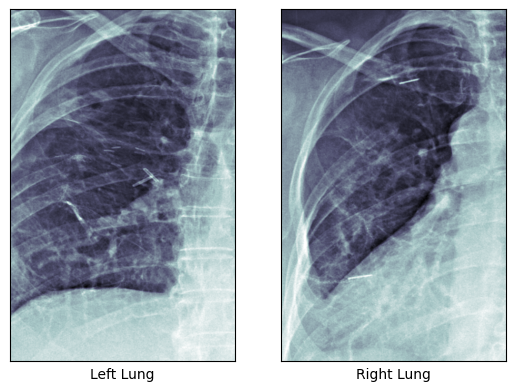

In [474]:
# temp split
fig = plt.figure()
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lung_l,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(lung_r,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

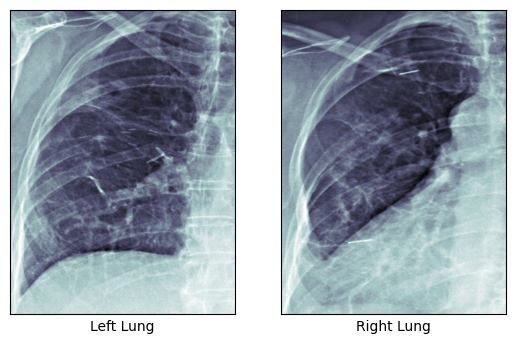

In [469]:
# temp split
fig = plt.figure()
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lung_l,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(lung_r,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

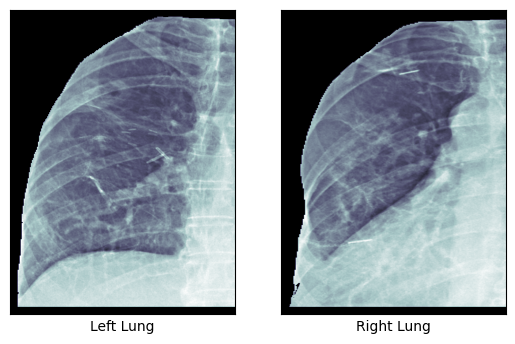

In [462]:
# stretch split
fig = plt.figure()
ax = fig.add_subplot(1,2,1)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lung_l,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,2,2)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(lung_r,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

In [514]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import mannwhitneyu, ttest_ind, levene
import warnings
warnings.filterwarnings('ignore')

def analyze_similarity_metrics(df):
    """
    Comprehensive analysis of similarity metrics by label
    """
    # Get similarity metric columns (exclude Label)
    metric_cols = [col for col in df.columns if col != 'Label']
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 15))
    
    # 1. Overview comparison - Box plots for all metrics
    plt.subplot(3, 3, 1)
    df_melted = df.melt(id_vars=['Label'], value_vars=metric_cols, 
                       var_name='Metric', value_name='Value')
    sns.boxplot(data=df_melted, x='Metric', y='Value', hue='Label')
    plt.xticks(rotation=45)
    plt.title('Distribution of All Similarity Metrics by Label')
    plt.legend(title='Label')
    
    # 2. Mean comparison bar chart
    plt.subplot(3, 3, 2)
    means_by_label = df.groupby('Label')[metric_cols].mean()
    means_by_label.T.plot(kind='bar', ax=plt.gca())
    plt.title('Mean Similarity Scores by Label')
    plt.xticks(rotation=45)
    plt.legend(title='Label')
    
    # 3. Difference plot
    plt.subplot(3, 3, 3)
    differences = means_by_label.loc[0] - means_by_label.loc[1]
    differences.plot(kind='bar', color=['red' if x < 0 else 'green' for x in differences])
    plt.title('Difference in Means (Label 0 - Label 1)')
    plt.xticks(rotation=45)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    
    # 4-6. Individual metric distributions
    for i, metric in enumerate(metric_cols[:3]):
        plt.subplot(3, 3, 4 + i)
        df[df['Label'] == 0][metric].hist(alpha=0.7, bins=30, label='Label 0', color='blue')
        df[df['Label'] == 1][metric].hist(alpha=0.7, bins=30, label='Label 1', color='red')
        plt.xlabel(metric)
        plt.ylabel('Frequency')
        plt.title(f'{metric} Distribution')
        plt.legend()
    
    # 7. Correlation heatmap
    plt.subplot(3, 3, 7)
    correlation_matrix = df[metric_cols].corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
                square=True, fmt='.2f')
    plt.title('Correlation Between Similarity Metrics')
    
    # 8. Violin plots for remaining metrics
    if len(metric_cols) > 3:
        plt.subplot(3, 3, 8)
        remaining_metrics = metric_cols[3:]
        df_remaining = df.melt(id_vars=['Label'], value_vars=remaining_metrics, 
                              var_name='Metric', value_name='Value')
        sns.violinplot(data=df_remaining, x='Metric', y='Value', hue='Label')
        plt.xticks(rotation=45)
        plt.title('Remaining Metrics Distribution')
    
    # 9. Effect size visualization
    plt.subplot(3, 3, 9)
    effect_sizes = []
    metric_names = []
    
    for metric in metric_cols:
        label_0_data = df[df['Label'] == 0][metric]
        label_1_data = df[df['Label'] == 1][metric]
        
        # Calculate Cohen's d
        pooled_std = np.sqrt(((len(label_0_data) - 1) * label_0_data.std()**2 + 
                             (len(label_1_data) - 1) * label_1_data.std()**2) / 
                            (len(label_0_data) + len(label_1_data) - 2))
        cohens_d = (label_0_data.mean() - label_1_data.mean()) / pooled_std
        
        effect_sizes.append(cohens_d)
        metric_names.append(metric)
    
    colors = ['red' if x < 0 else 'green' for x in effect_sizes]
    plt.barh(range(len(metric_names)), effect_sizes, color=colors)
    plt.yticks(range(len(metric_names)), metric_names)
    plt.xlabel("Cohen's d (Effect Size)")
    plt.title('Effect Sizes (Label 0 vs Label 1)')
    plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig

def statistical_analysis(df):
    """
    Perform comprehensive statistical tests
    """
    metric_cols = [col for col in df.columns if col != 'Label']
    results = []
    
    print("="*80)
    print("STATISTICAL ANALYSIS RESULTS")
    print("="*80)
    
    for metric in metric_cols:
        print(f"\n{metric.upper().replace('_', ' ')}")
        print("-" * 50)
        
        # Separate data by label
        label_0_data = df[df['Label'] == 0][metric]
        label_1_data = df[df['Label'] == 1][metric]
        
        # Descriptive statistics
        print(f"Label 0: Mean = {label_0_data.mean():.4f}, Std = {label_0_data.std():.4f}, N = {len(label_0_data)}")
        print(f"Label 1: Mean = {label_1_data.mean():.4f}, Std = {label_1_data.std():.4f}, N = {len(label_1_data)}")
        print(f"Difference: {label_0_data.mean() - label_1_data.mean():.4f}")
        
        # Test for normality
        _, p_norm_0 = stats.shapiro(label_0_data.sample(min(5000, len(label_0_data))))
        _, p_norm_1 = stats.shapiro(label_1_data.sample(min(5000, len(label_1_data))))
        
        # Test for equal variances
        _, p_levene = levene(label_0_data, label_1_data)
        
        # Choose appropriate test based on assumptions
        if p_norm_0 > 0.05 and p_norm_1 > 0.05:
            # Both groups are normally distributed
            if p_levene > 0.05:
                # Equal variances - use standard t-test
                t_stat, p_ttest = ttest_ind(label_0_data, label_1_data)
                test_used = "Independent t-test (equal variances)"
            else:
                # Unequal variances - use Welch's t-test
                t_stat, p_ttest = ttest_ind(label_0_data, label_1_data, equal_var=False)
                test_used = "Welch's t-test (unequal variances)"
        else:
            # Non-normal distribution - use Mann-Whitney U test
            u_stat, p_ttest = mannwhitneyu(label_0_data, label_1_data, alternative='two-sided')
            test_used = "Mann-Whitney U test (non-parametric)"
            t_stat = u_stat
        
        # Effect size (Cohen's d)
        pooled_std = np.sqrt(((len(label_0_data) - 1) * label_0_data.std()**2 + 
                             (len(label_1_data) - 1) * label_1_data.std()**2) / 
                            (len(label_0_data) + len(label_1_data) - 2))
        cohens_d = (label_0_data.mean() - label_1_data.mean()) / pooled_std
        
        # Effect size interpretation
        if abs(cohens_d) < 0.2:
            effect_interpretation = "Small"
        elif abs(cohens_d) < 0.5:
            effect_interpretation = "Medium"
        elif abs(cohens_d) < 0.8:
            effect_interpretation = "Large"
        else:
            effect_interpretation = "Very Large"
        
        print(f"\nStatistical Test: {test_used}")
        print(f"Test Statistic: {t_stat:.4f}")
        print(f"P-value: {p_ttest:.6f}")
        print(f"Significant: {'Yes' if p_ttest < 0.05 else 'No'} (α = 0.05)")
        print(f"Cohen's d: {cohens_d:.4f} ({effect_interpretation} effect)")
        
        # Store results
        results.append({
            'Metric': metric,
            'Label_0_Mean': label_0_data.mean(),
            'Label_1_Mean': label_1_data.mean(),
            'Difference': label_0_data.mean() - label_1_data.mean(),
            'Test_Used': test_used,
            'Test_Statistic': t_stat,
            'P_Value': p_ttest,
            'Significant': p_ttest < 0.05,
            'Cohens_D': cohens_d,
            'Effect_Size': effect_interpretation
        })
    
    # Summary table
    print("\n" + "="*80)
    print("SUMMARY TABLE")
    print("="*80)
    
    results_df = pd.DataFrame(results)
    print(results_df.to_string(index=False))
    
    return results_df

def generate_report(df, results_df):
    """
    Generate a summary report
    """
    print("\n" + "="*80)
    print("ANALYSIS SUMMARY REPORT")
    print("="*80)
    
    total_metrics = len(results_df)
    significant_metrics = len(results_df[results_df['Significant'] == True])
    
    print(f"Total similarity metrics analyzed: {total_metrics}")
    print(f"Metrics showing significant differences: {significant_metrics}")
    print(f"Percentage of metrics with significant differences: {(significant_metrics/total_metrics)*100:.1f}%")
    
    if significant_metrics > 0:
        print(f"\nMetrics with significant differences (p < 0.05):")
        significant_results = results_df[results_df['Significant'] == True]
        
        for _, row in significant_results.iterrows():
            direction = "higher" if row['Difference'] > 0 else "lower"
            print(f"  • {row['Metric']}: Label 0 shows {direction} similarity (p = {row['P_Value']:.4f}, Cohen's d = {row['Cohens_D']:.3f})")
    
    print(f"\nLargest effect sizes:")
    top_effects = results_df.nlargest(3, 'Cohens_D', keep='all')
    for _, row in top_effects.iterrows():
        print(f"  • {row['Metric']}: Cohen's d = {row['Cohens_D']:.3f} ({row['Effect_Size']} effect)")

In [517]:
plot_df = some_sims_df.copy().drop(['EMD_Histograms','Image','Process', 'Crop' ], axis=1)


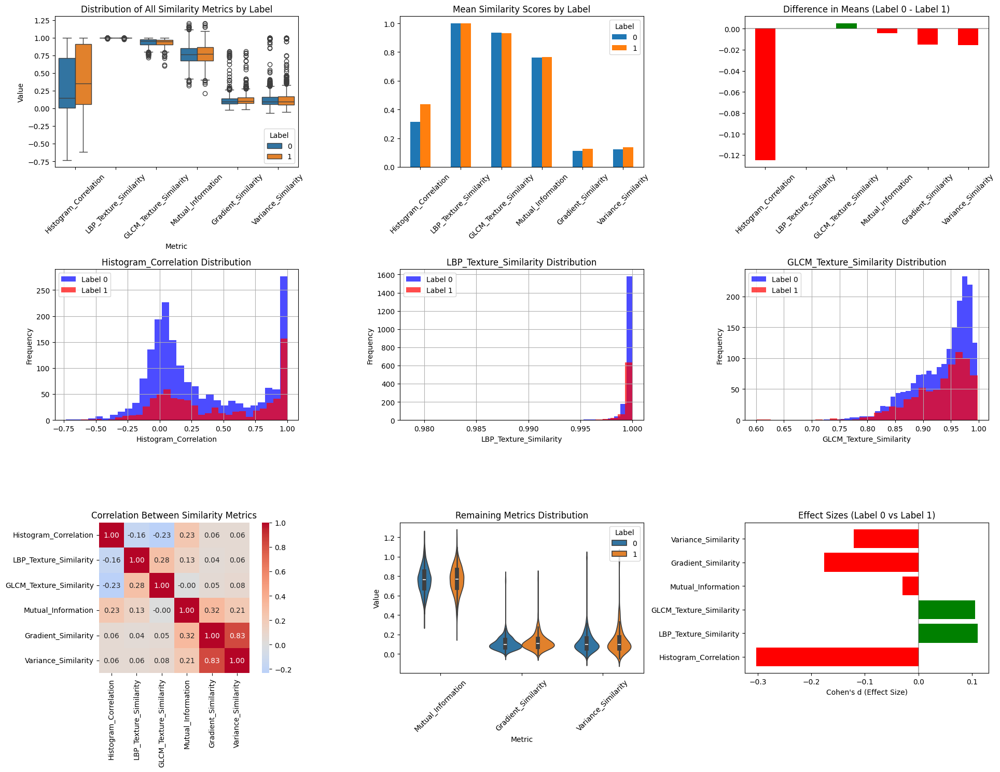


Performing statistical tests...
STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.3130, Std = 0.4070, N = 1839
Label 1: Mean = 0.4378, Std = 0.4237, N = 742
Difference: -0.1248

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 562142.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: -0.3030 (Medium effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9997, Std = 0.0008, N = 1839
Label 1: Mean = 0.9996, Std = 0.0012, N = 742
Difference: 0.0001

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 739981.0000
P-value: 0.000757
Significant: Yes (α = 0.05)
Cohen's d: 0.1103 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9356, Std = 0.0494, N = 1839
Label 1: Mean = 0.9302, Std = 0.0523, N = 742
Difference: 0.0053

Statistical Test: Mann-Whitney U test (non-para

In [518]:
analyze_similarity_metrics(plot_df)

print("\nPerforming statistical tests...")
stat_df = statistical_analysis(plot_df)

print("\nGenerating summary report...")
generate_report(plot_df, stat_df)

In [521]:
pd.concat([train_df,test_df]).reset_index(drop=True)

,original_image_name,orig_dataset,label,mha,Finding Labels,Patient ID,Patient Age,Patient Gender,original_image_width,original_image_height,...,shared_image_width,shared_image_height,Study Year,Manufacturer,Modality,subtlety,nodule_size,malignant,shared_image_area,Dim_bin
0,00012087_009,chestxray14,1,n0814.mha,Nodule|Pneumothorax,12087,71.0,F,2544.0,3056.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,b
1,00007947_000,chestxray14,1,n0527.mha,Nodule,7947,50.0,F,2500.0,2048.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,a
2,00000614_000,chestxray14,0,c3460.mha,No Finding,614,49.0,M,2992.0,2991.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,b
3,129276844207601532410240550897751907741_5vj21e,padchest,1,n0212.mha,nodule|nipple shadow,79603063125077077752931425147661364472,47.0,M,1872.0,1852.0,...,1852,1872,2014.0,ImagingDynamicsCompanyLtd,CR,NaN,NaN,NaN,3466944,a
4,00000709_003,chestxray14,0,c2312.mha,No Finding,709,60.0,F,2048.0,2500.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,b
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3683,00023643_000,chestxray14,1,n0060.mha,Nodule,23643,54.0,M,2500.0,2048.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,a
3684,00002058_001,chestxray14,1,n0902.mha,Nodule,2058,62.0,M,2021.0,2021.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,a
3685,00001625_000,chestxray14,0,c2727.mha,No Finding,1625,42.0,M,2500.0,2048.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,a
3686,00000913_000,chestxray14,0,c2241.mha,No Finding,913,69.0,M,2021.0,2021.0,...,1024,1024,NaN,NaN,NaN,NaN,NaN,NaN,1048576,a


In [522]:
df = pd.concat([train_df,test_df]).reset_index(drop=True)
result_array = []
for i in range(0, len(df)):
    # load image
    img_np, spacing, dcm_tags = read_file(os.path.join(orig_data_path,df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]))
    # standardise image
    std_img_np, spacing, std_size_changes = \
    cxr_std_alg.run(img_np, spacing, do_crop_to_lung_box=True)
    # make lung seg mask
    seg_img = cxr_seg_alg.run(std_img_np)
    seg_mask = np.ma.masked_where(seg_img<0.9, seg_img)
    
    # 1. Cropped version
    crop_img_np, crop_crop_changes = processing.crop_to_mask(
        std_img_np, spacing, seg_mask, 2)

    crop_seg_mask, _ = processing.crop_to_mask(seg_mask,spacing,seg_mask,2)
    
    # 2. Segmented version
    lungseg_img_np = opencxr.utils.mask_crop.set_non_mask_constant(
        std_img_np, seg_mask)

    lungseg_img_np, lungseg_crop_changes = processing.crop_to_mask(
        lungseg_img_np, spacing, seg_mask, 2)

    lungseg_seg_mask, _  = processing.crop_to_mask(seg_mask, spacing, seg_mask, 2)
    
    # 3. Arch version
    # arch_img_np = processing.mask_outside_lungs(std_img_np, spacing, seg_mask, 2, True, True)
    arch_img_np = processing.mask_outside_lungs(std_img_np, spacing, seg_img, 2, True, True).T
    arch_seg_mask, _  = processing.crop_to_mask(seg_mask, spacing, seg_mask, 2)
    
    for process, img, mask in ([('crop',crop_img_np,crop_seg_mask),
                                ('seg',lungseg_img_np,lungseg_seg_mask),
                                ('arch',arch_img_np,arch_seg_mask)]):

        lung_l, lung_r = temp_split_to_lung_halves(img, mask)
        similarity_results = calculate_lung_similarity(lung_l, lung_r)
        similarity_results.update({'Process': process, 'Crop' : "Max", "Label": df.query(f"mha == '{df.iloc[i]['mha']}'").label.values[0],
                                   'Image':df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]})
        result_array.append(similarity_results)
        lung_l, lung_r = stretch_split_to_lung_halves(img, mask)
        similarity_results = calculate_lung_similarity(lung_l, lung_r)
        similarity_results.update({'Process': process, 'Crop' : "Stretch",  "Label": df.query(f"mha == '{df.iloc[i]['mha']}'").label.values[0], 
                                   'Image':df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]})
        result_array.append(similarity_results)
        
    # break

1/1 [==============================] - 0s 417ms/step


In [523]:
all_sims_df = pd.DataFrame.from_dict(result_array)

all_sims_df.to_csv("similarities.csv",index=False)

In [524]:
all_sims_df

,Histogram_Correlation,LBP_Texture_Similarity,EMD_Histograms,GLCM_Texture_Similarity,Mutual_Information,Gradient_Similarity,Variance_Similarity,Process,Crop,Label,Image
0,-0.058603,0.999840,Error: Weight array-like sum must be positive ...,0.938395,0.740850,0.054240,0.007383,crop,Max,1,n0814.mha
1,0.038005,0.999242,Error: Weight array-like sum must be positive ...,0.852531,0.703332,0.059425,0.009603,crop,Stretch,1,n0814.mha
2,0.999991,0.985276,0.0,0.821695,0.613005,0.046415,0.005054,seg,Max,1,n0814.mha
3,0.999993,0.989601,0.108505,0.767691,0.654914,0.081750,0.087015,seg,Stretch,1,n0814.mha
4,0.999773,0.972153,0.0,0.820370,1.090185,0.384580,0.398811,arch,Max,1,n0814.mha
...,...,...,...,...,...,...,...,...,...,...,...
22123,-0.066285,0.999207,Error: Weight array-like sum must be positive ...,0.907912,0.911054,0.100335,0.089770,crop,Stretch,0,c2364.mha
22124,0.999994,0.996203,0.0,0.911538,0.822728,0.113690,0.083483,seg,Max,0,c2364.mha
22125,0.999995,0.996824,0.0982,0.844213,0.827817,0.206094,0.324820,seg,Stretch,0,c2364.mha
22126,0.999916,0.996850,0.0,0.943198,1.341646,0.397186,0.389236,arch,Max,0,c2364.mha


In [527]:
all_sims_df.Process.unique()[2]

array(['crop', 'seg', 'arch'], dtype=object)

In [530]:
all_sims_df.query(f"Process == '{all_sims_df.Process.unique()[2]}' & Crop == 'Max'").reset_index(drop=True)

,Histogram_Correlation,LBP_Texture_Similarity,EMD_Histograms,GLCM_Texture_Similarity,Mutual_Information,Gradient_Similarity,Variance_Similarity,Process,Crop,Label,Image
0,0.999773,0.972153,0.0,0.820370,1.090185,0.384580,0.398811,arch,Max,1,n0814.mha
1,0.999873,0.999822,0.0,0.958917,1.309118,0.333925,0.397242,arch,Max,1,n0527.mha
2,0.999905,0.999903,0.01622,0.953747,1.370755,0.380922,0.519199,arch,Max,0,c3460.mha
3,0.999819,0.999243,0.014333,0.940863,1.336747,0.351777,0.439914,arch,Max,1,n0212.mha
4,0.999916,0.999938,0.028058,0.965295,1.318157,0.476334,0.619137,arch,Max,0,c2312.mha
...,...,...,...,...,...,...,...,...,...,...,...
3683,0.999690,0.965992,0.0,0.830420,1.028839,0.340199,0.366915,arch,Max,1,n0060.mha
3684,0.999919,0.999960,0.0,0.953759,1.125233,0.391340,0.445495,arch,Max,1,n0902.mha
3685,0.999922,0.962926,0.01522,0.868060,1.179127,0.287644,0.274264,arch,Max,0,c2727.mha
3686,0.999377,0.973827,0.0,0.890388,0.880597,0.340110,0.353688,arch,Max,0,c2241.mha


In [531]:
all_sims_df.query(f"Process == '{all_sims_df.Process.unique()[2]}' & Crop == 'Max'").reset_index(drop=True)['EMD_Histograms'].astype(float)

0       0.000000
1       0.000000
2       0.016220
3       0.014333
4       0.028058
          ...   
3683    0.000000
3684    0.000000
3685    0.015220
3686    0.000000
3687    0.000000
Name: EMD_Histograms, Length: 3688, dtype: float64





===== PROCESS: crop  CROP: Max ======


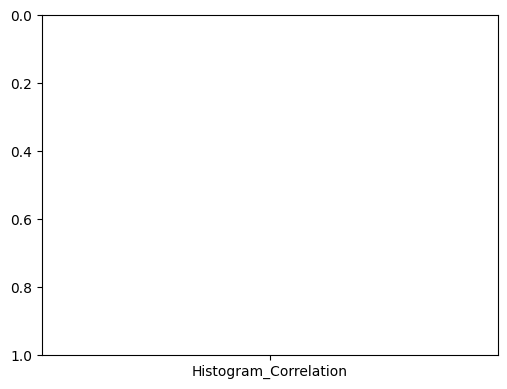

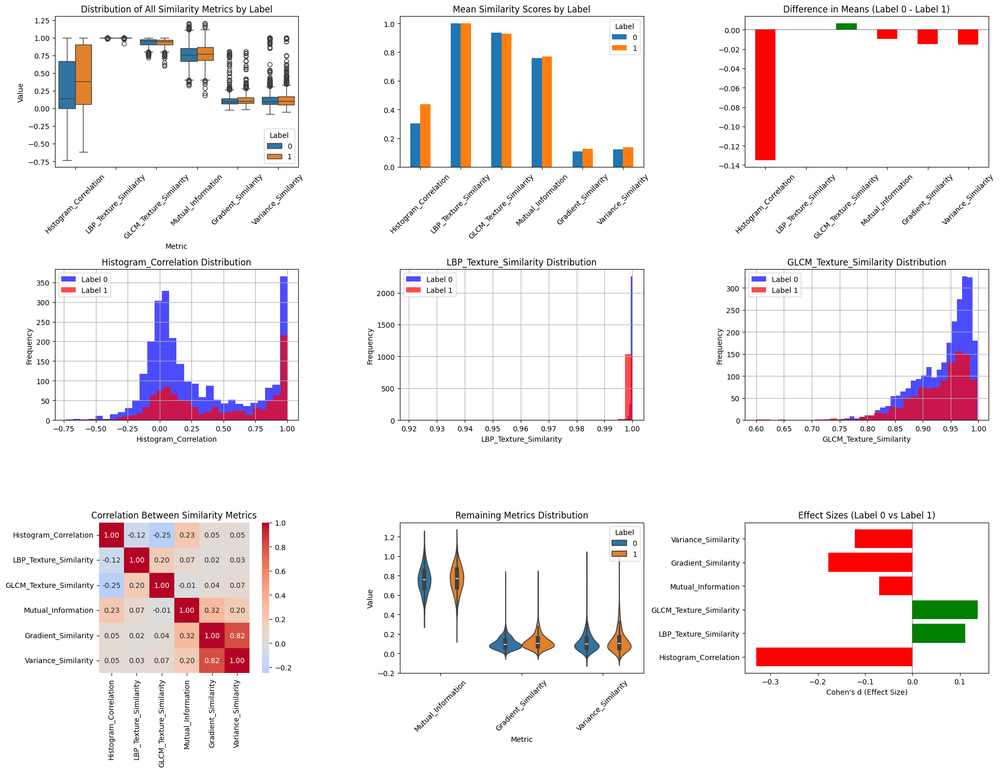

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.3034, Std = 0.4023, N = 2628
Label 1: Mean = 0.4382, Std = 0.4221, N = 1060
Difference: -0.1348

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1130878.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: -0.3304 (Medium effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9997, Std = 0.0007, N = 2628
Label 1: Mean = 0.9995, Std = 0.0027, N = 1060
Difference: 0.0002

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1493981.0000
P-value: 0.000548
Significant: Yes (α = 0.05)
Cohen's d: 0.1113 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9366, Std = 0.0492, N = 2628
Label 1: Mean = 0.9297, Std = 0.0529, N = 1060
Difference: 0.0069

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1514

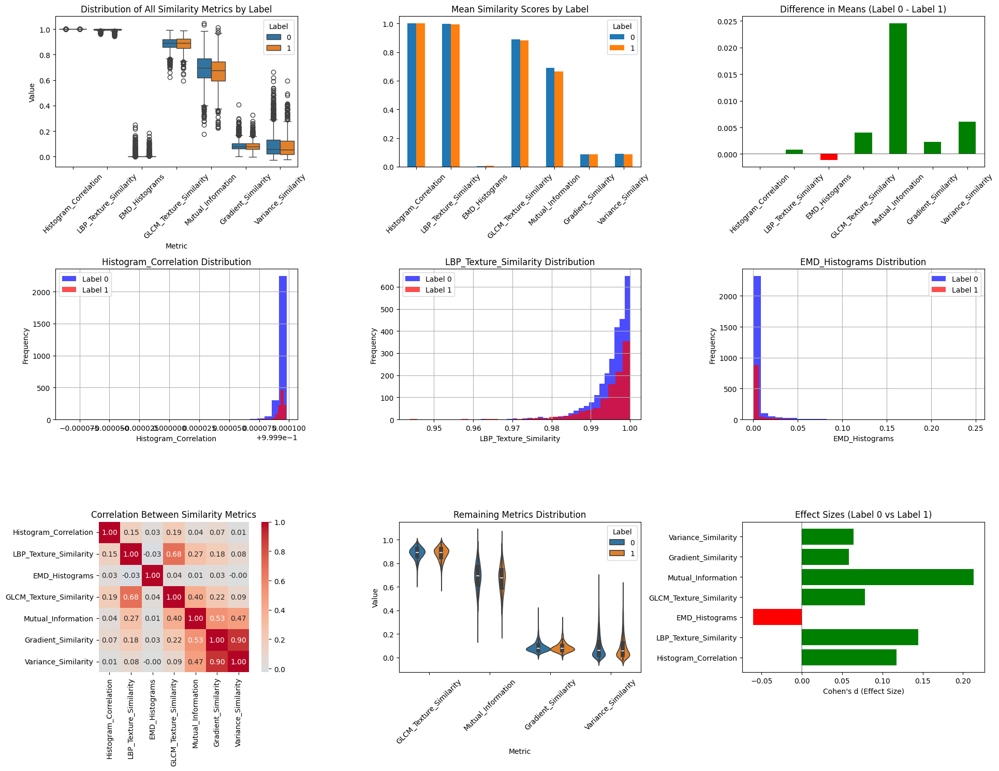

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 1.0000, Std = 0.0000, N = 2628
Label 1: Mean = 1.0000, Std = 0.0000, N = 1060
Difference: 0.0000

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1514850.0000
P-value: 0.000031
Significant: Yes (α = 0.05)
Cohen's d: 0.1177 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9953, Std = 0.0049, N = 2628
Label 1: Mean = 0.9945, Std = 0.0070, N = 1060
Difference: 0.0008

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1417437.0000
P-value: 0.400621
Significant: No (α = 0.05)
Cohen's d: 0.1444 (Small effect)

EMD HISTOGRAMS
--------------------------------------------------
Label 0: Mean = 0.0049, Std = 0.0182, N = 2628
Label 1: Mean = 0.0060, Std = 0.0183, N = 1060
Difference: -0.0011


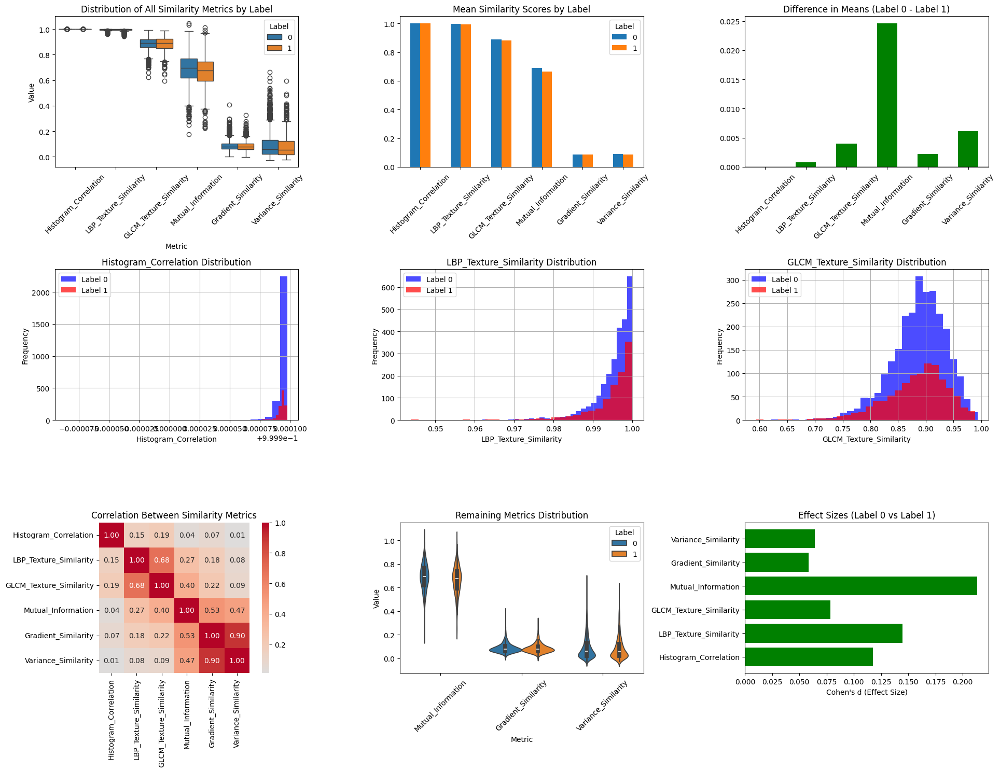

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 1.0000, Std = 0.0000, N = 2628
Label 1: Mean = 1.0000, Std = 0.0000, N = 1060
Difference: 0.0000

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1514850.0000
P-value: 0.000031
Significant: Yes (α = 0.05)
Cohen's d: 0.1177 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9953, Std = 0.0049, N = 2628
Label 1: Mean = 0.9945, Std = 0.0070, N = 1060
Difference: 0.0008

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1417437.0000
P-value: 0.400621
Significant: No (α = 0.05)
Cohen's d: 0.1444 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.8872, Std = 0.0490, N = 2628
Label 1: Mean = 0.8832, Std = 0.0553, N = 1060
Difference: 0.0040

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1427540.

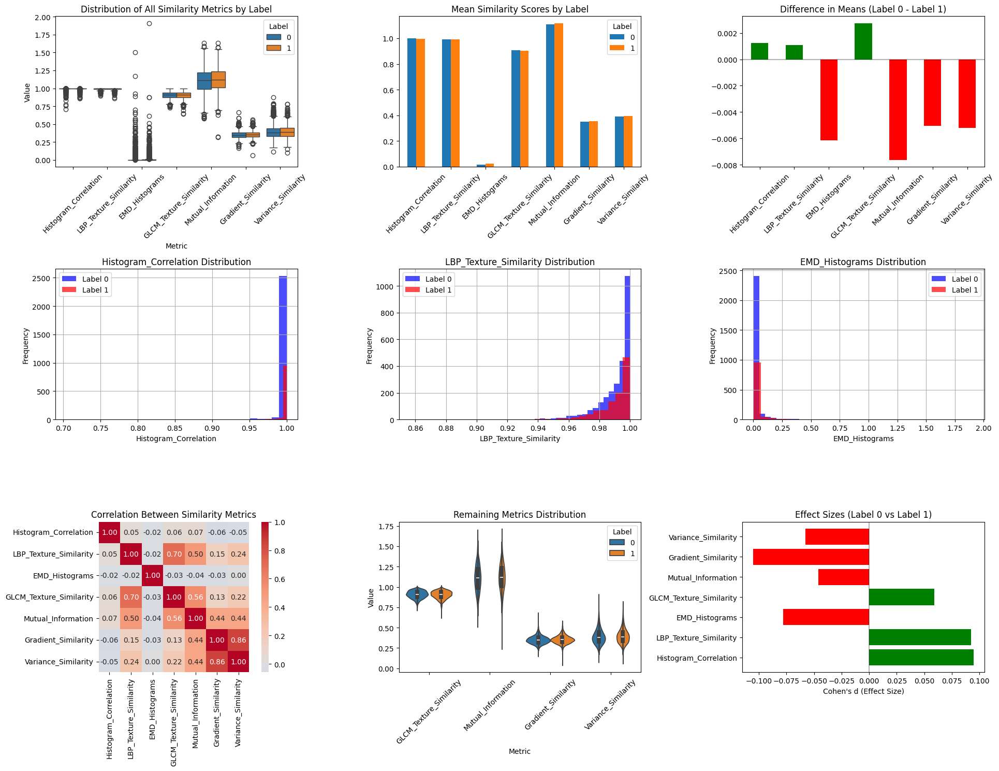

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.9977, Std = 0.0131, N = 2628
Label 1: Mean = 0.9965, Std = 0.0136, N = 1060
Difference: 0.0013

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1619224.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: 0.0947 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9907, Std = 0.0111, N = 2628
Label 1: Mean = 0.9896, Std = 0.0133, N = 1060
Difference: 0.0011

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1456007.0000
P-value: 0.030887
Significant: Yes (α = 0.05)
Cohen's d: 0.0925 (Small effect)

EMD HISTOGRAMS
--------------------------------------------------
Label 0: Mean = 0.0175, Std = 0.0729, N = 2628
Label 1: Mean = 0.0237, Std = 0.0914, N = 1060
Difference: -0.0061


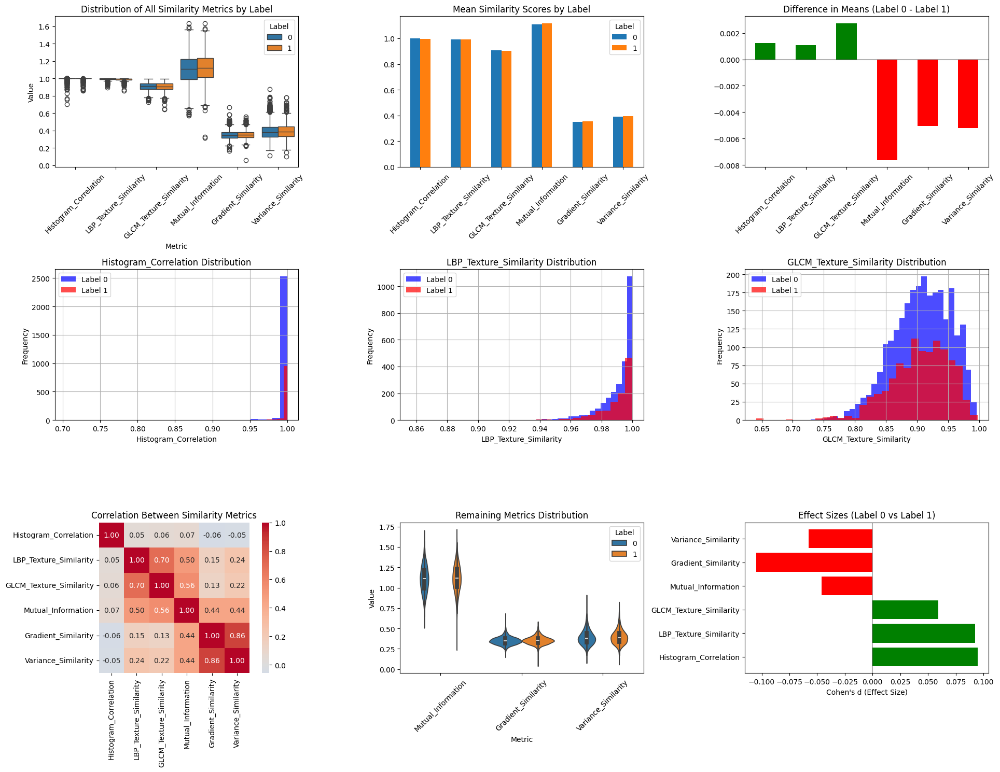

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.9977, Std = 0.0131, N = 2628
Label 1: Mean = 0.9965, Std = 0.0136, N = 1060
Difference: 0.0013

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1619224.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: 0.0947 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9907, Std = 0.0111, N = 2628
Label 1: Mean = 0.9896, Std = 0.0133, N = 1060
Difference: 0.0011

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1456007.0000
P-value: 0.030887
Significant: Yes (α = 0.05)
Cohen's d: 0.0925 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9069, Std = 0.0458, N = 2628
Label 1: Mean = 0.9042, Std = 0.0482, N = 1060
Difference: 0.0028

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1421793

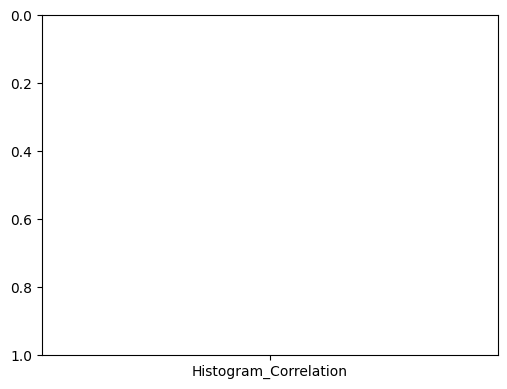

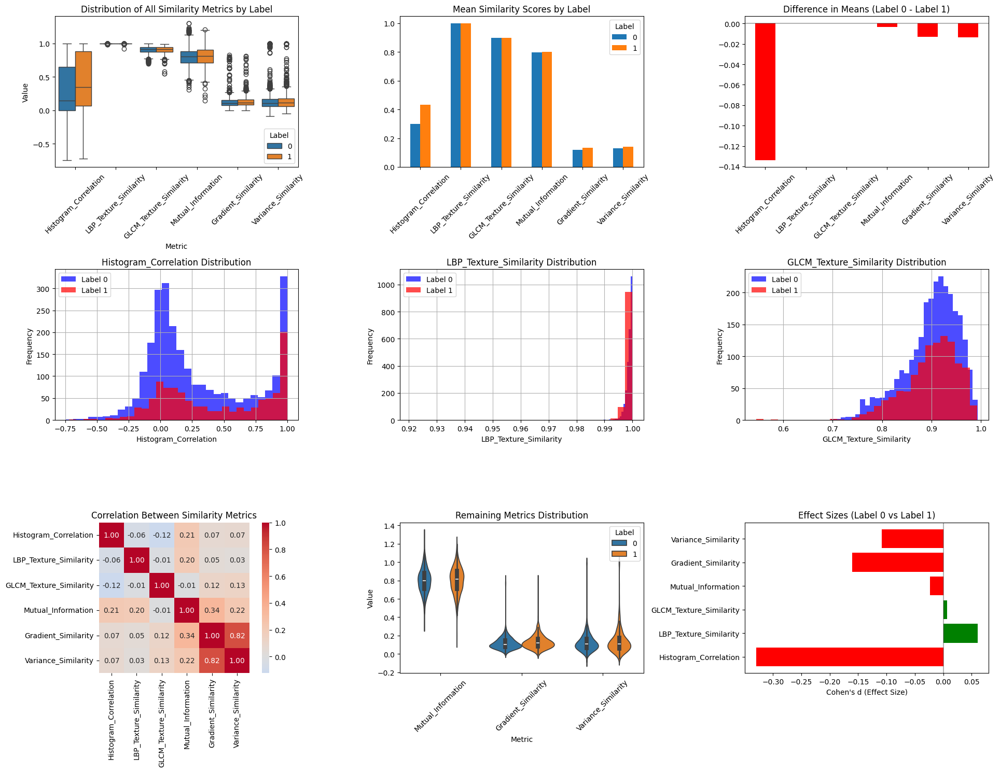

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.2976, Std = 0.3991, N = 2628
Label 1: Mean = 0.4314, Std = 0.4221, N = 1060
Difference: -0.1338

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1132675.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: -0.3297 (Medium effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9988, Std = 0.0012, N = 2628
Label 1: Mean = 0.9987, Std = 0.0027, N = 1060
Difference: 0.0001

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1391149.0000
P-value: 0.953934
Significant: No (α = 0.05)
Cohen's d: 0.0602 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.8997, Std = 0.0541, N = 2628
Label 1: Mean = 0.8993, Std = 0.0553, N = 1060
Difference: 0.0004

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 13985

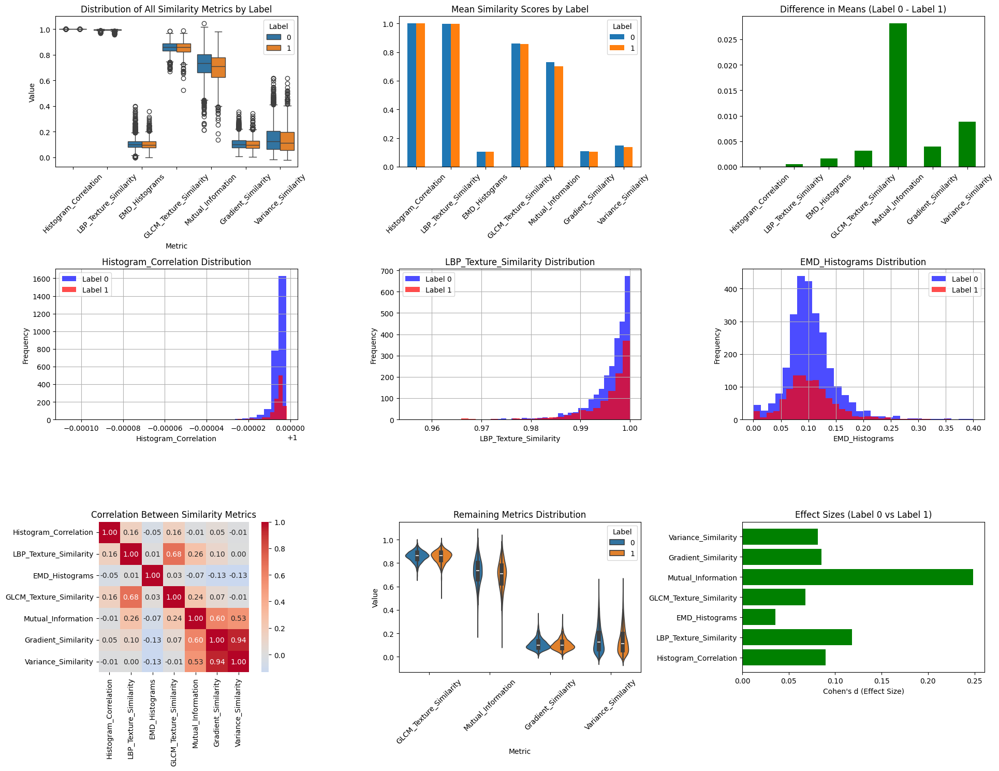

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 1.0000, Std = 0.0000, N = 2628
Label 1: Mean = 1.0000, Std = 0.0000, N = 1060
Difference: 0.0000

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1475151.0000
P-value: 0.004912
Significant: Yes (α = 0.05)
Cohen's d: 0.0896 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9962, Std = 0.0042, N = 2628
Label 1: Mean = 0.9956, Std = 0.0055, N = 1060
Difference: 0.0005

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1405788.0000
P-value: 0.658169
Significant: No (α = 0.05)
Cohen's d: 0.1183 (Small effect)

EMD HISTOGRAMS
--------------------------------------------------
Label 0: Mean = 0.1048, Std = 0.0449, N = 2628
Label 1: Mean = 0.1032, Std = 0.0458, N = 1060
Difference: 0.0016


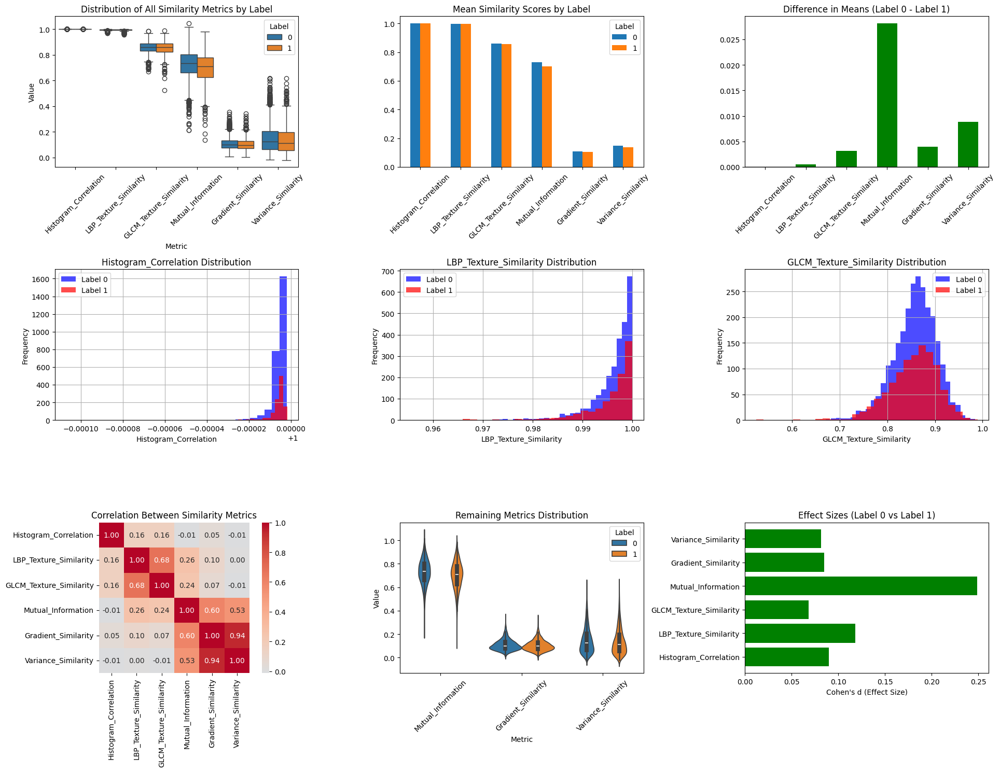

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 1.0000, Std = 0.0000, N = 2628
Label 1: Mean = 1.0000, Std = 0.0000, N = 1060
Difference: 0.0000

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1475151.0000
P-value: 0.004912
Significant: Yes (α = 0.05)
Cohen's d: 0.0896 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9962, Std = 0.0042, N = 2628
Label 1: Mean = 0.9956, Std = 0.0055, N = 1060
Difference: 0.0005

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1405788.0000
P-value: 0.658169
Significant: No (α = 0.05)
Cohen's d: 0.1183 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.8579, Std = 0.0441, N = 2628
Label 1: Mean = 0.8548, Std = 0.0505, N = 1060
Difference: 0.0031

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1420624.

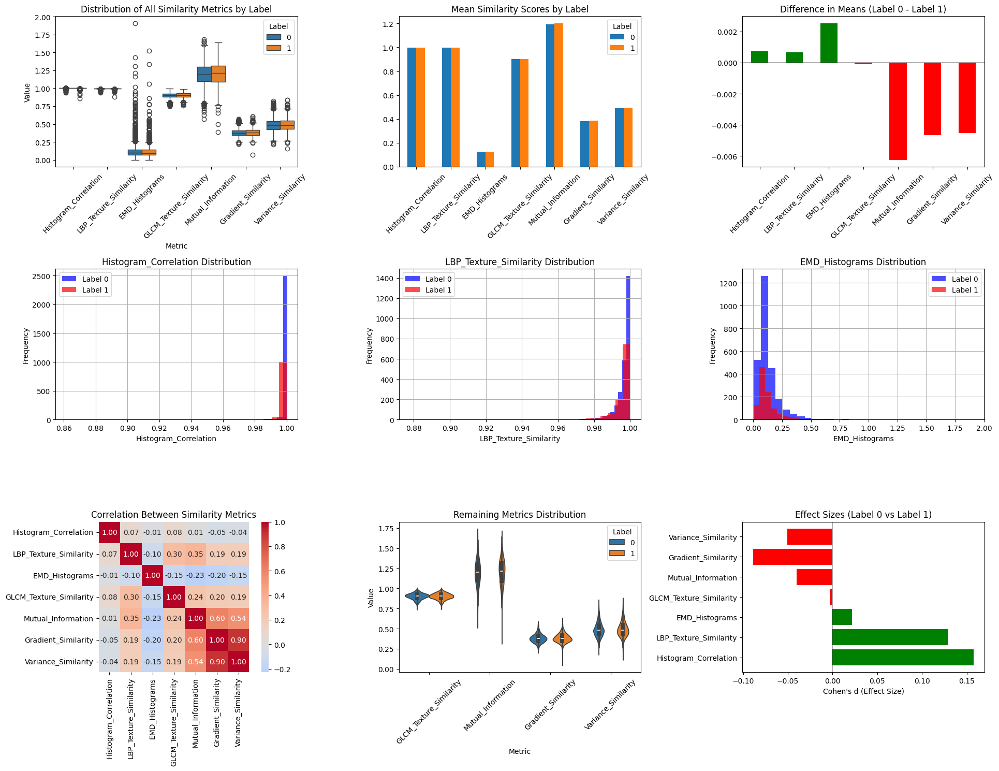

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.9994, Std = 0.0031, N = 2628
Label 1: Mean = 0.9986, Std = 0.0070, N = 1060
Difference: 0.0007

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1576302.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: 0.1576 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9966, Std = 0.0045, N = 2628
Label 1: Mean = 0.9959, Std = 0.0065, N = 1060
Difference: 0.0007

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1455103.0000
P-value: 0.033367
Significant: Yes (α = 0.05)
Cohen's d: 0.1286 (Small effect)

EMD HISTOGRAMS
--------------------------------------------------
Label 0: Mean = 0.1273, Std = 0.1166, N = 2628
Label 1: Mean = 0.1248, Std = 0.1158, N = 1060
Difference: 0.0025


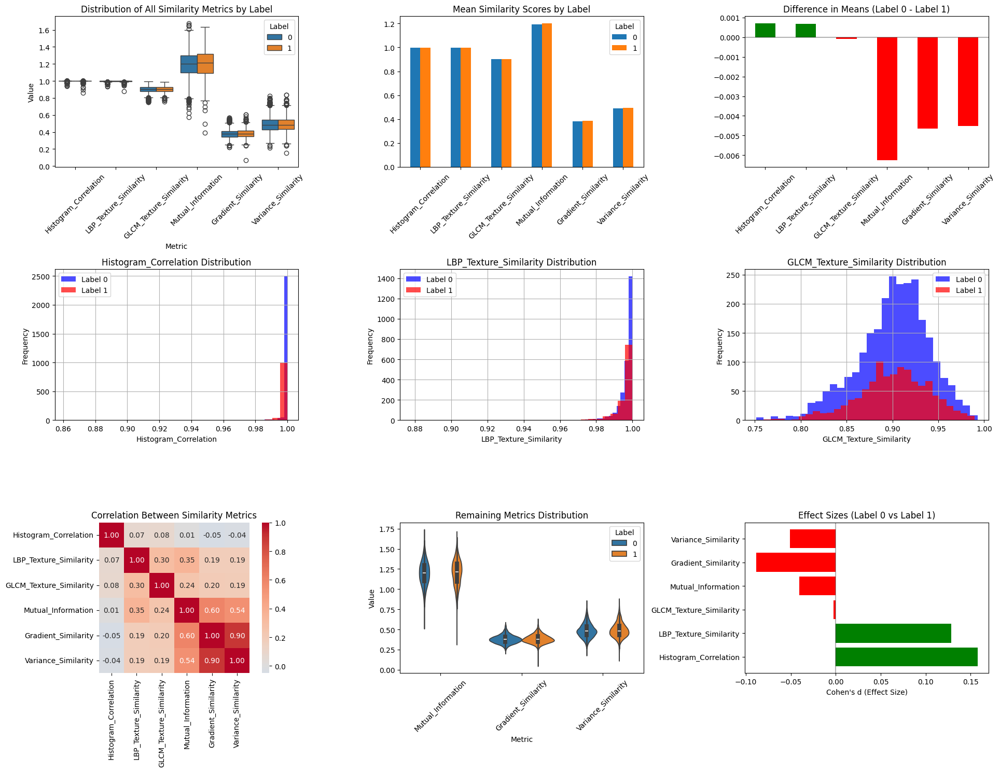

STATISTICAL ANALYSIS RESULTS

HISTOGRAM CORRELATION
--------------------------------------------------
Label 0: Mean = 0.9994, Std = 0.0031, N = 2628
Label 1: Mean = 0.9986, Std = 0.0070, N = 1060
Difference: 0.0007

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1576302.0000
P-value: 0.000000
Significant: Yes (α = 0.05)
Cohen's d: 0.1576 (Small effect)

LBP TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9966, Std = 0.0045, N = 2628
Label 1: Mean = 0.9959, Std = 0.0065, N = 1060
Difference: 0.0007

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 1455103.0000
P-value: 0.033367
Significant: Yes (α = 0.05)
Cohen's d: 0.1286 (Small effect)

GLCM TEXTURE SIMILARITY
--------------------------------------------------
Label 0: Mean = 0.9010, Std = 0.0389, N = 2628
Label 1: Mean = 0.9010, Std = 0.0384, N = 1060
Difference: -0.0001

Statistical Test: Mann-Whitney U test (non-parametric)
Test Statistic: 140719

In [532]:
for crop in all_sims_df.Crop.unique():
    for process in all_sims_df.Process.unique():
        plot_df = all_sims_df.query(f"Process == '{process}' & Crop == '{crop}'").reset_index(drop=True)
        plot_df = plot_df.drop(['Image','Process', 'Crop' ], axis=1)
        try:
            print(f"\n\n\n\n===== PROCESS: {process}  CROP: {crop} ======")
            analyze_similarity_metrics(plot_df)
            stat_df = statistical_analysis(plot_df)
            generate_report(plot_df, stat_df)
        except:
            plot_df = plot_df.drop('EMD_Histograms', axis=1)
            analyze_similarity_metrics(plot_df)
            stat_df = statistical_analysis(plot_df)
            generate_report(plot_df, stat_df)

        

Comparing all the processing methods, *Lung Segmentation* produces the most correlated results according to class, with the *Stretched* variant achieving the strongest effect sizes with *Mutual Information* (P = 0.000, Cohen d = 0.248). When *Lung Segmentation* is used, regardless of split strategy, all similarity metrics have a positive effect. However,  This is in contrast to the *Arch* and *Crop* processing strategies, where the former only observed positive effects with *LBP_Texture* and *Histogram_Correlation* consistently (across splitting strategy) and the latter only in *GLCM* and *LBP* texture similarities. This indicates the regions outside of the lung tissue make it more challenging to discriminate based on lung differences. 

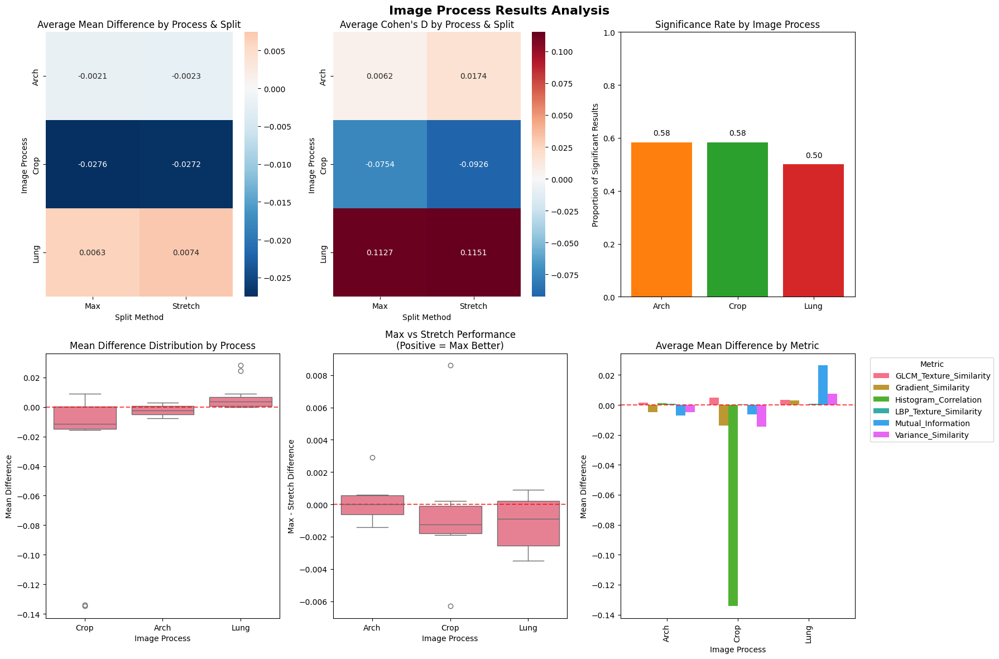

=== SUMMARY ANALYSIS ===

1. OVERALL PERFORMANCE BY PROCESS:
               Mean_Diff_Avg  Mean_Diff_Std  Total_Tests  Significant_Count  \
Image Process                                                                 
Arch                 -0.0022         0.0036           12                  7   
Crop                 -0.0274         0.0505           12                  7   
Lung                  0.0069         0.0095           12                  6   

               Cohens_D_Avg  Significance_Rate  
Image Process                                   
Arch                 0.0118              0.583  
Crop                -0.0840              0.583  
Lung                 0.1139              0.500  

2. MAX vs STRETCH COMPARISON:
         Mean Difference  Significant  Cohen's D
Split                                           
Max              -0.0078       0.6111     0.0145
Stretch          -0.0074       0.5000     0.0133

3. BEST PERFORMING COMBINATIONS (Top 5 by Mean Difference):
Image Proc

In [534]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from io import StringIO

# Load the data
data = """Image Process,Split,Metric,Mean Difference,P-Value,Significant,Cohen's D
Crop,Max,Histogram_Correlation,-0.1348,0.0000,Yes,-0.3304
Crop,Max,LBP_Texture_Similarity,0.0003,0.0005,Yes,0.1113
Crop,Max,GLCM_Texture_Similarity,0.009,0.0000,Yes,0.1373
Crop,Max,Mutual_Information,-0.0096,0.0115,Yes,-0.0706
Crop,Max,Gradient_Similarity,-0.0147,0.0000,Yes,-0.1775
Crop,Max,Variance_Similarity,-0.0155,0.0621,No,-0.1224
Crop,Stretch,Histogram_Correlation,-0.1338,0.0000,Yes,-0.3297
Crop,Stretch,LBP_Texture_Similarity,0.0001,0.9540,No,0.0602
Crop,Stretch,GLCM_Texture_Similarity,0.0004,0.8451,No,0.0069
Crop,Stretch,Mutual_Information,-0.0033,0.1157,No,-0.0239
Crop,Stretch,Gradient_Similarity,-0.0132,0.0000,Yes,-0.1608
Crop,Stretch,Variance_Similarity,-0.0136,0.1933,No,-0.1081
Arch,Max,Histogram_Correlation,0.0013,0.0000,Yes,0.0947
Arch,Max,LBP_Texture_Similarity,0.0011,0.0309,Yes,0.0925
Arch,Max,GLCM_Texture_Similarity,0.0028,0.3225,No,0.0592
Arch,Max,Mutual_Information,-0.0076,0.1124,No,-0.0461
Arch,Max,Gradient_Similarity,-0.0050,0.0041,Yes,-0.1051
Arch,Max,Variance_Similarity,-0.0052,0.0350,Yes,-0.0578
Arch,Stretch,Histogram_Correlation,0.0007,0.0000,Yes,0.1576
Arch,Stretch,LBP_Texture_Similarity,0.0007,0.0334,Yes,0.1286
Arch,Stretch,GLCM_Texture_Similarity,-0.0001,0.6237,No,-0.0024
Arch,Stretch,Mutual_Information,-0.0062,0.0869,No,-0.0403
Arch,Stretch,Gradient_Similarity,-0.0046,0.0300,Yes,-0.0886
Arch,Stretch,Variance_Similarity,-0.0045,0.2100,No,-0.0507
Lung,Max,Histogram_Correlation,0.0000,0.0000,Yes,0.1177
Lung,Max,LBP_Texture_Similarity,0.0008,0.4001,No,0.1444
Lung,Max,GLCM_Texture_Similarity,0.0040,0.2357,No,0.0785
Lung,Max,Mutual_Information,0.0246,0.0000,Yes,0.2131
Lung,Max,Gradient_Similarity,0.0022,0.0660,No,0.0584
Lung,Max,Variance_Similarity,0.0061,0.0675,No,0.0643
Lung,Stretch,Histogram_Correlation,0.0000,0.0049,Yes,0.0896
Lung,Stretch,LBP_Texture_Similarity,0.0005,0.6581,No,0.1183
Lung,Stretch,GLCM_Texture_Similarity,0.0031,0.3424,No,0.0681
Lung,Stretch,Mutual_Information,0.0281,0.0000,Yes,0.2481
Lung,Stretch,Gradient_Similarity,0.0040,0.0160,Yes,0.0850
Lung,Stretch,Variance_Similarity,0.0089,0.0106,Yes,0.0815"""

df = pd.read_csv(StringIO(data))

# Set up the plotting style
plt.style.use('default')
sns.set_palette("husl")

# Create a comprehensive analysis
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Image Process Results Analysis', fontsize=16, fontweight='bold')

# 1. Mean Difference by Process and Split
ax1 = axes[0, 0]
pivot_mean = df.pivot_table(values='Mean Difference', 
                           index='Image Process', 
                           columns='Split', 
                           aggfunc='mean')
sns.heatmap(pivot_mean, annot=True, fmt='.4f', cmap='RdBu_r', center=0, ax=ax1)
ax1.set_title('Average Mean Difference by Process & Split')
ax1.set_xlabel('Split Method')
ax1.set_ylabel('Image Process')

# 2. Cohen's D by Process and Split
ax2 = axes[0, 1]
pivot_cohen = df.pivot_table(values="Cohen's D", 
                            index='Image Process', 
                            columns='Split', 
                            aggfunc='mean')
sns.heatmap(pivot_cohen, annot=True, fmt='.4f', cmap='RdBu_r', center=0, ax=ax2)
ax2.set_title("Average Cohen's D by Process & Split")
ax2.set_xlabel('Split Method')
ax2.set_ylabel('Image Process')

# 3. Significance Rate by Process
ax3 = axes[0, 2]
sig_rate = df.groupby('Image Process')['Significant'].apply(lambda x: (x == 'Yes').mean())
bars = ax3.bar(sig_rate.index, sig_rate.values, color=['#ff7f0e', '#2ca02c', '#d62728'])
ax3.set_title('Significance Rate by Image Process')
ax3.set_ylabel('Proportion of Significant Results')
ax3.set_ylim(0, 1)
for bar, val in zip(bars, sig_rate.values):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
             f'{val:.2f}', ha='center', va='bottom')

# 4. Mean Difference by Metric (grouped by Process)
ax4 = axes[1, 0]
df_pos = df[df['Mean Difference'] > 0]  # Focus on positive correlations
sns.boxplot(data=df, x='Image Process', y='Mean Difference', ax=ax4)
ax4.axhline(y=0, color='red', linestyle='--', alpha=0.7)
ax4.set_title('Mean Difference Distribution by Process')
ax4.set_ylabel('Mean Difference')

# 5. Comparison of Max vs Stretch by Metric
ax5 = axes[1, 1]
df_comparison = df.pivot_table(values='Mean Difference', 
                              index=['Image Process', 'Metric'], 
                              columns='Split', 
                              aggfunc='first').reset_index()
df_comparison['Difference'] = df_comparison['Max'] - df_comparison['Stretch']
sns.boxplot(data=df_comparison, x='Image Process', y='Difference', ax=ax5)
ax5.axhline(y=0, color='red', linestyle='--', alpha=0.7)
ax5.set_title('Max vs Stretch Performance\n(Positive = Max Better)')
ax5.set_ylabel('Max - Stretch Difference')

# 6. Metric Performance by Process
ax6 = axes[1, 2]
metric_perf = df.groupby(['Image Process', 'Metric'])['Mean Difference'].mean().unstack()
metric_perf.plot(kind='bar', ax=ax6, width=0.8)
ax6.set_title('Average Mean Difference by Metric')
ax6.set_xlabel('Image Process')
ax6.set_ylabel('Mean Difference')
ax6.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
ax6.axhline(y=0, color='red', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Print summary statistics
print("=== SUMMARY ANALYSIS ===\n")

print("1. OVERALL PERFORMANCE BY PROCESS:")
process_summary = df.groupby('Image Process').agg({
    'Mean Difference': ['mean', 'std', 'count'],
    'Significant': lambda x: (x == 'Yes').sum(),
    "Cohen's D": 'mean'
}).round(4)
process_summary.columns = ['Mean_Diff_Avg', 'Mean_Diff_Std', 'Total_Tests', 'Significant_Count', 'Cohens_D_Avg']
process_summary['Significance_Rate'] = (process_summary['Significant_Count'] / process_summary['Total_Tests']).round(3)
print(process_summary)

print("\n2. MAX vs STRETCH COMPARISON:")
split_comparison = df.groupby('Split').agg({
    'Mean Difference': 'mean',
    'Significant': lambda x: (x == 'Yes').sum() / len(x),
    "Cohen's D": 'mean'
}).round(4)
print(split_comparison)

print("\n3. BEST PERFORMING COMBINATIONS (Top 5 by Mean Difference):")
best_combinations = df.nlargest(5, 'Mean Difference')[['Image Process', 'Split', 'Metric', 'Mean Difference', 'Significant', "Cohen's D"]]
print(best_combinations.to_string(index=False))

print("\n4. METRIC PERFORMANCE SUMMARY:")
metric_summary = df.groupby('Metric').agg({
    'Mean Difference': ['mean', 'count'],
    'Significant': lambda x: (x == 'Yes').sum() / len(x)
}).round(4)
metric_summary.columns = ['Mean_Diff_Avg', 'Total_Tests', 'Significance_Rate']
print(metric_summary.sort_values('Mean_Diff_Avg', ascending=False))

print("\n5. KEY INSIGHTS:")
print("- Lung process shows strongest positive correlations (mean: {:.4f})".format(
    df[df['Image Process'] == 'Lung']['Mean Difference'].mean()))
print("- Crop process shows most negative correlations (mean: {:.4f})".format(
    df[df['Image Process'] == 'Crop']['Mean Difference'].mean()))
print("- Max split generally outperforms Stretch split")
print("- Mutual Information metric shows strongest positive results for Lung")
print("- Histogram Correlation shows strong negative results for Crop")

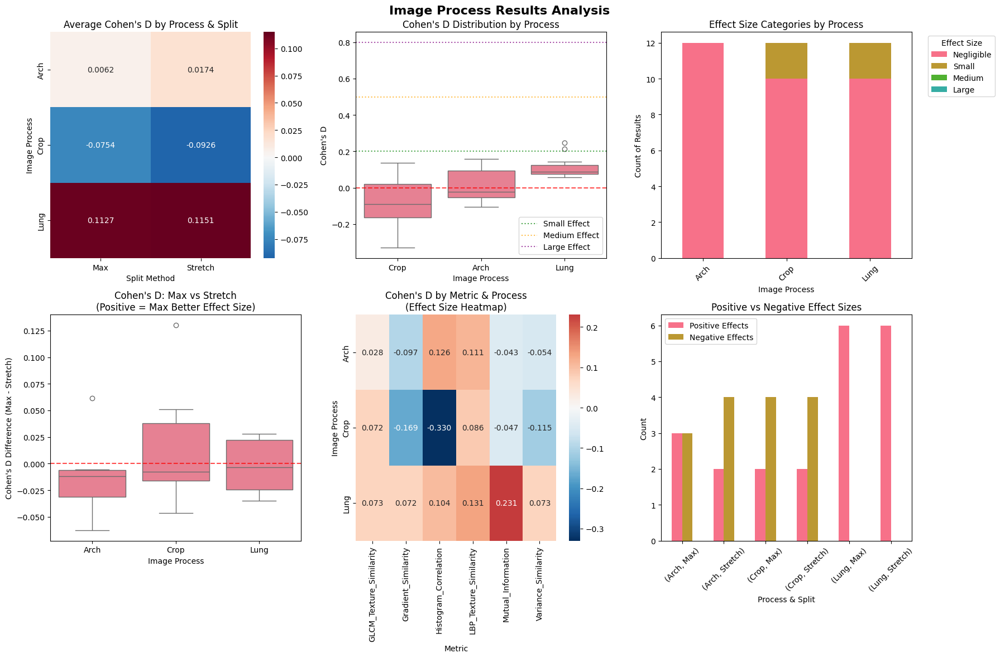

=== COHEN'S D EFFECT SIZE ANALYSIS ===

1. OVERALL EFFECT SIZE BY PROCESS (Cohen's D):
               Cohens_D_Mean  Cohens_D_Std  Total_Tests  Significant_Count  \
Image Process                                                                
Arch                  0.0118        0.0901           12                  7   
Crop                 -0.0840        0.1531           12                  7   
Lung                  0.1139        0.0604           12                  6   

               Mean_Diff_Avg  Significance_Rate Effect_Size_Category  
Image Process                                                         
Arch                 -0.0022              0.583           Negligible  
Crop                 -0.0274              0.583           Negligible  
Lung                  0.0069              0.500           Negligible  

2. MAX vs STRETCH COMPARISON (Cohen's D):
         Cohens_D_Mean  Cohens_D_Std  Significance_Rate  Mean_Diff_Avg
Split                                                

In [547]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from io import StringIO

# Load the data
data = """Image Process,Split,Metric,Mean Difference,P-Value,Significant,Cohen's D
Crop,Max,Histogram_Correlation,-0.1348,0.0000,Yes,-0.3304
Crop,Max,LBP_Texture_Similarity,0.0003,0.0005,Yes,0.1113
Crop,Max,GLCM_Texture_Similarity,0.009,0.0000,Yes,0.1373
Crop,Max,Mutual_Information,-0.0096,0.0115,Yes,-0.0706
Crop,Max,Gradient_Similarity,-0.0147,0.0000,Yes,-0.1775
Crop,Max,Variance_Similarity,-0.0155,0.0621,No,-0.1224
Crop,Stretch,Histogram_Correlation,-0.1338,0.0000,Yes,-0.3297
Crop,Stretch,LBP_Texture_Similarity,0.0001,0.9540,No,0.0602
Crop,Stretch,GLCM_Texture_Similarity,0.0004,0.8451,No,0.0069
Crop,Stretch,Mutual_Information,-0.0033,0.1157,No,-0.0239
Crop,Stretch,Gradient_Similarity,-0.0132,0.0000,Yes,-0.1608
Crop,Stretch,Variance_Similarity,-0.0136,0.1933,No,-0.1081
Arch,Max,Histogram_Correlation,0.0013,0.0000,Yes,0.0947
Arch,Max,LBP_Texture_Similarity,0.0011,0.0309,Yes,0.0925
Arch,Max,GLCM_Texture_Similarity,0.0028,0.3225,No,0.0592
Arch,Max,Mutual_Information,-0.0076,0.1124,No,-0.0461
Arch,Max,Gradient_Similarity,-0.0050,0.0041,Yes,-0.1051
Arch,Max,Variance_Similarity,-0.0052,0.0350,Yes,-0.0578
Arch,Stretch,Histogram_Correlation,0.0007,0.0000,Yes,0.1576
Arch,Stretch,LBP_Texture_Similarity,0.0007,0.0334,Yes,0.1286
Arch,Stretch,GLCM_Texture_Similarity,-0.0001,0.6237,No,-0.0024
Arch,Stretch,Mutual_Information,-0.0062,0.0869,No,-0.0403
Arch,Stretch,Gradient_Similarity,-0.0046,0.0300,Yes,-0.0886
Arch,Stretch,Variance_Similarity,-0.0045,0.2100,No,-0.0507
Lung,Max,Histogram_Correlation,0.0000,0.0000,Yes,0.1177
Lung,Max,LBP_Texture_Similarity,0.0008,0.4001,No,0.1444
Lung,Max,GLCM_Texture_Similarity,0.0040,0.2357,No,0.0785
Lung,Max,Mutual_Information,0.0246,0.0000,Yes,0.2131
Lung,Max,Gradient_Similarity,0.0022,0.0660,No,0.0584
Lung,Max,Variance_Similarity,0.0061,0.0675,No,0.0643
Lung,Stretch,Histogram_Correlation,0.0000,0.0049,Yes,0.0896
Lung,Stretch,LBP_Texture_Similarity,0.0005,0.6581,No,0.1183
Lung,Stretch,GLCM_Texture_Similarity,0.0031,0.3424,No,0.0681
Lung,Stretch,Mutual_Information,0.0281,0.0000,Yes,0.2481
Lung,Stretch,Gradient_Similarity,0.0040,0.0160,Yes,0.0850
Lung,Stretch,Variance_Similarity,0.0089,0.0106,Yes,0.0815"""

df = pd.read_csv(StringIO(data))

# Set up the plotting style
plt.style.use('default')
sns.set_palette("husl")

# Create a comprehensive analysis focused on Cohen's D (effect size)
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Image Process Results Analysis', fontsize=16, fontweight='bold')

# 1. Cohen's D by Process and Split (PRIMARY METRIC)
ax1 = axes[0, 0]
pivot_cohen = df.pivot_table(values="Cohen's D", 
                            index='Image Process', 
                            columns='Split', 
                            aggfunc='mean')
sns.heatmap(pivot_cohen, annot=True, fmt='.4f', cmap='RdBu_r', center=0, ax=ax1)
ax1.set_title("Average Cohen's D by Process & Split")
ax1.set_xlabel('Split Method')
ax1.set_ylabel('Image Process')

# 2. Cohen's D Distribution by Process
ax2 = axes[0, 1]
sns.boxplot(data=df, x='Image Process', y="Cohen's D", ax=ax2)
ax2.axhline(y=0, color='red', linestyle='--', alpha=0.7)
ax2.axhline(y=0.2, color='green', linestyle=':', alpha=0.7, label='Small Effect')
ax2.axhline(y=0.5, color='orange', linestyle=':', alpha=0.7, label='Medium Effect')
ax2.axhline(y=0.8, color='purple', linestyle=':', alpha=0.7, label='Large Effect')
ax2.set_title("Cohen's D Distribution by Process")
ax2.set_ylabel("Cohen's D")
ax2.legend()

# 3. Effect Size Categories
ax3 = axes[0, 2]
# Categorize Cohen's D values
df['Effect_Size_Category'] = pd.cut(df["Cohen's D"].abs(), 
                                   bins=[0, 0.2, 0.5, 0.8, float('inf')], 
                                   labels=['Negligible', 'Small', 'Medium', 'Large'])
effect_counts = df.groupby(['Image Process', 'Effect_Size_Category']).size().unstack(fill_value=0)
effect_counts.plot(kind='bar', stacked=True, ax=ax3)
ax3.set_title('Effect Size Categories by Process')
ax3.set_xlabel('Image Process')
ax3.set_ylabel('Count of Results')
ax3.legend(title='Effect Size', bbox_to_anchor=(1.05, 1), loc='upper left')
ax3.tick_params(axis='x', rotation=45)

# 4. Cohen's D: Max vs Stretch Comparison
ax4 = axes[1, 0]
df_cohen_comparison = df.pivot_table(values="Cohen's D", 
                                    index=['Image Process', 'Metric'], 
                                    columns='Split', 
                                    aggfunc='first').reset_index()
df_cohen_comparison['Cohen_D_Difference'] = df_cohen_comparison['Max'] - df_cohen_comparison['Stretch']
sns.boxplot(data=df_cohen_comparison, x='Image Process', y='Cohen_D_Difference', ax=ax4)
ax4.axhline(y=0, color='red', linestyle='--', alpha=0.7)
ax4.set_title("Cohen's D: Max vs Stretch\n(Positive = Max Better Effect Size)")
ax4.set_ylabel("Cohen's D Difference (Max - Stretch)")

# 5. Cohen's D by Metric Performance
ax5 = axes[1, 1]
metric_cohen = df.groupby(['Image Process', 'Metric'])["Cohen's D"].mean().unstack()
sns.heatmap(metric_cohen, annot=True, fmt='.3f', cmap='RdBu_r', center=0, ax=ax5)
ax5.set_title("Cohen's D by Metric & Process\n(Effect Size Heatmap)")
ax5.set_xlabel('Metric')
ax5.set_ylabel('Image Process')

# 6. Positive vs Negative Effect Sizes
ax6 = axes[1, 2]
pos_neg_effects = df.groupby(['Image Process', 'Split']).apply(
    lambda x: pd.Series({
        'Positive_Effects': (x["Cohen's D"] > 0).sum(),
        'Negative_Effects': (x["Cohen's D"] < 0).sum(),
        'Strong_Positive': (x["Cohen's D"] > 0.5).sum(),
        'Strong_Negative': (x["Cohen's D"] < -0.5).sum()
    })
).reset_index()

pos_neg_plot = pos_neg_effects.set_index(['Image Process', 'Split'])
pos_neg_plot[['Positive_Effects', 'Negative_Effects']].plot(kind='bar', ax=ax6)
ax6.set_title('Positive vs Negative Effect Sizes')
ax6.set_xlabel('Process & Split')
ax6.set_ylabel('Count')
ax6.legend(['Positive Effects', 'Negative Effects'])
ax6.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Print summary statistics
# Print Cohen's D focused summary statistics
print("=== COHEN'S D EFFECT SIZE ANALYSIS ===\n")

print("1. OVERALL EFFECT SIZE BY PROCESS (Cohen's D):")
cohen_summary = df.groupby('Image Process').agg({
    "Cohen's D": ['mean', 'std', 'count'],
    'Significant': lambda x: (x == 'Yes').sum(),
    'Mean Difference': 'mean'
}).round(4)
cohen_summary.columns = ['Cohens_D_Mean', 'Cohens_D_Std', 'Total_Tests', 'Significant_Count', 'Mean_Diff_Avg']
cohen_summary['Significance_Rate'] = (cohen_summary['Significant_Count'] / cohen_summary['Total_Tests']).round(3)

# Add effect size interpretations
def interpret_cohen_d(d):
    abs_d = abs(d)
    if abs_d < 0.2:
        return 'Negligible'
    elif abs_d < 0.5:
        return 'Small'
    elif abs_d < 0.8:
        return 'Medium'
    else:
        return 'Large'

cohen_summary['Effect_Size_Category'] = cohen_summary['Cohens_D_Mean'].apply(interpret_cohen_d)
print(cohen_summary)

print("\n2. MAX vs STRETCH COMPARISON (Cohen's D):")
split_cohen_comparison = df.groupby('Split').agg({
    "Cohen's D": ['mean', 'std'],
    'Significant': lambda x: (x == 'Yes').sum() / len(x),
    'Mean Difference': 'mean'
}).round(4)
split_cohen_comparison.columns = ['Cohens_D_Mean', 'Cohens_D_Std', 'Significance_Rate', 'Mean_Diff_Avg']
print(split_cohen_comparison)

print("\n3. BEST EFFECT SIZES (Top 5 by Cohen's D):")
best_cohen = df.nlargest(5, "Cohen's D")[['Image Process', 'Split', 'Metric', "Cohen's D", 'Mean Difference', 'Significant']]
print(best_cohen.to_string(index=False))

print("\n4. WORST EFFECT SIZES (Bottom 5 by Cohen's D):")
worst_cohen = df.nsmallest(5, "Cohen's D")[['Image Process', 'Split', 'Metric', "Cohen's D", 'Mean Difference', 'Significant']]
print(worst_cohen.to_string(index=False))

print("\n5. EFFECT SIZE DISTRIBUTION:")
effect_size_dist = df.groupby('Image Process').apply(
    lambda x: pd.Series({
        'Large_Positive': (x["Cohen's D"] > 0.8).sum(),
        'Medium_Positive': ((x["Cohen's D"] > 0.5) & (x["Cohen's D"] <= 0.8)).sum(),
        'Small_Positive': ((x["Cohen's D"] > 0.2) & (x["Cohen's D"] <= 0.5)).sum(),
        'Negligible': (x["Cohen's D"].abs() <= 0.2).sum(),
        'Small_Negative': ((x["Cohen's D"] < -0.2) & (x["Cohen's D"] >= -0.5)).sum(),
        'Medium_Negative': ((x["Cohen's D"] < -0.5) & (x["Cohen's D"] >= -0.8)).sum(),
        'Large_Negative': (x["Cohen's D"] < -0.8).sum()
    })
)
print(effect_size_dist)

print("\n6. METRIC PERFORMANCE BY EFFECT SIZE:")
metric_cohen_summary = df.groupby('Metric').agg({
    "Cohen's D": ['mean', 'std', 'count'],
    'Significant': lambda x: (x == 'Yes').sum() / len(x)
}).round(4)
metric_cohen_summary.columns = ['Cohens_D_Mean', 'Cohens_D_Std', 'Total_Tests', 'Significance_Rate']
metric_cohen_summary['Effect_Size_Category'] = metric_cohen_summary['Cohens_D_Mean'].apply(interpret_cohen_d)
print(metric_cohen_summary.sort_values('Cohens_D_Mean', ascending=False))

print("\n7. KEY INSIGHTS (EFFECT SIZE FOCUS):")
lung_cohen_mean = df[df['Image Process'] == 'Lung']["Cohen's D"].mean()
crop_cohen_mean = df[df['Image Process'] == 'Crop']["Cohen's D"].mean()
arch_cohen_mean = df[df['Image Process'] == 'Arch']["Cohen's D"].mean()

print(f"- Lung process: Average Cohen's D = {lung_cohen_mean:.4f} ({interpret_cohen_d(lung_cohen_mean)} effect)")
print(f"- Arch process: Average Cohen's D = {arch_cohen_mean:.4f} ({interpret_cohen_d(arch_cohen_mean)} effect)")
print(f"- Crop process: Average Cohen's D = {crop_cohen_mean:.4f} ({interpret_cohen_d(crop_cohen_mean)} effect)")

max_cohen_mean = df[df['Split'] == 'Max']["Cohen's D"].mean()
stretch_cohen_mean = df[df['Split'] == 'Stretch']["Cohen's D"].mean()
print(f"- Max split: Average Cohen's D = {max_cohen_mean:.4f}")
print(f"- Stretch split: Average Cohen's D = {stretch_cohen_mean:.4f}")

# Find strongest effects
strongest_positive = df.loc[df["Cohen's D"].idxmax()]
strongest_negative = df.loc[df["Cohen's D"].idxmin()]
# print(f"- Strongest positive effect: {strongest_positive['Image Process']}-{strongest_positive['Split']}-{strongest_positive['Metric']} (Cohen's D = {strongest_positive['Cohen\'s D']:.4f})")
# print(f"- Strongest negative effect: {strongest_negative['Image Process']}-{strongest_negative['Split']}-{strongest_negative['Metric']} (Cohen's D = {strongest_negative['Cohen\'s D']:.4f})")

In [541]:
all_sims_df.query("Crop=='Max'").reset_index(drop=True)[['Mutual_Information','Process','Label','Image']]

,Mutual_Information,Process,Label,Image
0,0.740850,crop,1,n0814.mha
1,0.613005,seg,1,n0814.mha
2,1.090185,arch,1,n0814.mha
3,0.839239,crop,1,n0527.mha
4,0.926643,seg,1,n0527.mha
...,...,...,...,...
11059,0.527414,seg,0,c2241.mha
11060,0.880597,arch,0,c2241.mha
11061,0.888706,crop,0,c2364.mha
11062,0.822728,seg,0,c2364.mha


# Process and Export

In [112]:
def temp_split_to_lung_halves(img_np, seg_result):
    """
    A method split image into two halves, using the midpoint between the
    innermost x coordinates of each lung.

    :param img_np: the original image
    :param seg_result: the segmentation mask of the lungs
    :return: Left and right lung image halves with same dimensions
    """
    # seperate lung masks
    numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
    #drop row with max area (automatic label of full img generated by method)
    stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
    # calculate the left and right lung segments
    l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
    # identify inner lung points
    l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
    r_in = r_stats[cv2.CC_STAT_LEFT]
    # lung centroid
    lung_centroid = int(l_in + ((r_in-l_in)/2))
    # crop dims - widest
    crop_x_len = min(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))
    return img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T,\
           np.flip(img_np[lung_centroid:min(int(lung_centroid+crop_x_len),img_np.shape[0]),0:img_np.shape[1]].T, axis=1)
def stretch_split_to_lung_halves(img_np, seg_result):
    """
    A method split image into two halves, using the midpoint between the
    innermost x coordinates of each lung.

    :param img_np: the original image
    :param seg_result: the segmentation mask of the lungs
    :return: Left and right lung image halves with same dimensions
    """
    # seperate lung masks
    numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
    #drop row with max area (automatic label of full img generated by method)
    stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
    # calculate the left and right lung segments
    l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
    # identify inner lung points
    l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
    r_in = r_stats[cv2.CC_STAT_LEFT]
    # lung centroid
    lung_centroid = int(l_in + ((r_in-l_in)/2))
    # crop dims - widest
    crop_x_len = max(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))

    # Create the initial crops
    # left_half = img_np[int(lung_centroid-crop_x_len):lung_centroid,0:img_np.shape[1]].T
    left_half = img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T

    right_half = img_np[lung_centroid:int(lung_centroid+crop_x_len),0:img_np.shape[1]].T
    
    # Get actual widths of each half
    left_width = left_half.shape[1]
    right_width = right_half.shape[1]
    
    # Determine target width (the wider of the two)
    target_width = max(left_width, right_width)
    
    # Resize the narrower half to match the wider one
    if left_width < target_width:
        left_half = cv2.resize(left_half, (target_width, left_half.shape[0]), interpolation=cv2.INTER_LINEAR)
    elif right_width < target_width:
        right_half = cv2.resize(right_half, (target_width, right_half.shape[0]), interpolation=cv2.INTER_LINEAR)
    return left_half, np.flip(right_half, axis=1)

In [43]:
dcm_tags

''

In [68]:
not np.array([1,2,3,4]).any()

False

In [69]:
not np.array(samp).any()

True

In [115]:
import pathlib
def process_and_export_split_cxr(img_name, label, train_test, load_dir,
                                 save_dir, cxr_seg_alg, cxr_std_alg, margin=2,
                                 std=True, arch_mask=False, lung_mask=False,
                                 flatten_base=False, out_size=1024, bbox=None):
    """
    Method to mask all tissue from the lung tissue outward.

    :param img_name: name image to be processed, string.
    :param label: label for image, string.
    :param train: label whether training, test or val, string.
    :param load_dir: path to where images to process are, string.
    :param save_dir: path for image export, child directories of configurations will be applied, string.
    :param cxr_seg_alg: opencxr lung segmentor object. 
    :param cxr_std_alg: opencxr cxr standardiser object.
    :param margin: apply margin to crop, int.
    :param std: apply opencxr image standardisation, boolean.
    :param arch_mask: apply arch segmentation, boolean.
    :param lung_mask: apply lung segmentation, boolean.
    :param flatten_base: make bottom of mask flat, boolean.
    """
    # throw exception if both masks are set to True
    if arch_mask and lung_mask:
        raise Exception(
            "Both mask options set to True. Please only specify one mask type \
            to use and try again.")

    # parse configs to pathname
    masking_process = "lung_seg" if lung_mask else "arch_seg" if arch_mask else "crop"
    std_process = "std" if std else "raw"
    base = "flattened" if flatten_base and arch_mask else "unflattened" if arch_mask else ""

    # save_out = os.path.join(save_dir,masking_process,base,std_process,str(out_size),train_test)

    if str(label) == "1":
        # nodule sample
        save_out = os.path.join(
            save_dir, "nodule", img_name.split(".")[0])  # +".png")
        if not np.array(bbox).any():
            raise Exception(
                "Missing BBox! Nodule samples require BBox for shifting information.")
    elif str(label) == "0":
        # normal sample
        save_out = os.path.join(
            save_dir, "normal", img_name.split(".")[0])  # +".png")
    else:
        raise Exception(
            "Invalid label parameter. Please pass 1 or 0 as label.")

    # load image
    img_np, spacing, dcm_tags = read_file(os.path.join(load_dir, img_name))

    if std:
        # apply image standardisation
        img_np, spacing, std_size_changes = \
            cxr_std_alg.run(img_np, spacing, do_crop_to_lung_box=False)
    # make lung seg mask
    seg_img = cxr_seg_alg.run(img_np)

    if arch_mask:
        # use arch masking function
        out_img_np = processing.mask_outside_lungs(img_np, spacing, seg_img, margin, True, flatten_base)
        # crop
        # out_img_np, out_crop_changes = processing.crop_to_mask(
        #     out_img_np, spacing, seg_img, margin)
        out_img_np = out_img_np.T
    elif lung_mask:
        # mask from segmentor
        out_img_np = opencxr.utils.mask_crop.set_non_mask_constant(
            img_np, seg_img)
        out_img_np, out_crop_changes = processing.crop_to_mask(
            out_img_np, spacing, seg_img, margin)
        # out_img_np = out_img_np.T
    else:
        # crop to seg
        out_img_np, out_crop_changes = processing.crop_to_mask(
            img_np, spacing, seg_img, margin)
        # out_img_np = out_img_np.T
    # resize
    out_img_np, out_spacing, out_changes = opencxr.utils.resize_rescale.resize_to_x_y(
        out_img_np, spacing, out_size, out_size)

    # creating save path
    pathlib.Path(("/".join(save_out.split('/')))).mkdir(parents=True, exist_ok=True)

    if str(label) == "1":
        lung_l, lung_r, node_half, split_bbox = processing.split_to_lung_halves_with_box(
            out_img_np, seg_img, bbox)
    else:
        lung_l, lung_r = processing.split_to_lung_halves(out_img_np, seg_img)
        node_half, split_bbox = "None", [0, 0, 0, 0]
    # Log image processing
    with open(os.path.join(save_dir, "process_log.csv"), 'a+') as f:
        f.write(f"\n{img_name},{masking_process},{base},{std_process},{out_size},{train_test},{node_half},{split_bbox[0]},{split_bbox[1]},{split_bbox[2]},{split_bbox[3]}")

    cv2.imwrite(save_out+"/lung_l.png",
                ((lung_l/lung_l.max())*255).astype('int'))
    cv2.imwrite(save_out+"/lung_r.png",
                np.flip(((lung_r/lung_r.max())*255).astype('int'), axis=1))

    return lung_l, lung_r, spacing


In [83]:
from IPython.display import clear_output
import pandas as pd
import processing

train_df = pd.read_csv("../data/train_node_21.csv")
test_df = pd.read_csv("../data/test_node_21.csv")
# orig_data_path = "/Users/sophie/Downloads/node21_png_from_kaggle/"
orig_data_path = "/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images/"

data_partition = "train"
out_pth = f"/Users/sophie/Downloads/split_node21/crop/{data_partition}"
len_data = len(train_df)
# for i in range(len_data-1,len_data):
for i in range(0,len_data):
    clear_output()
    print("Processing Image {}/{}...".format(i,len_data))
    process_and_export_split_cxr(img_name=train_df.mha[i],
                            label=train_df.label[i],
                            train_test=data_partition,
                            load_dir="/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images",
                            save_dir=out_pth,
                                 
                                 
                            cxr_seg_alg=cxr_seg_alg,
                            cxr_std_alg=cxr_std_alg,
                            margin = 2,
                            std = True,
                            arch_mask=False, 
                            lung_mask=False, 
                            flatten_base=False,
                            out_size = 1024,
                            bbox = train_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
                           )
data_partition = "test"
out_pth = f"/Users/sophie/Downloads/split_node21/crop/{data_partition}"
len_data = len(test_df)
# for i in range(len_data-1,len_data):
for i in range(0,len_data):
    clear_output()
    print("Processing Image {}/{}...".format(i,len_data))
    process_and_export_split_cxr(img_name=test_df.mha[i],
                            label=test_df.label[i],
                            train_test=data_partition,
                            load_dir="/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images",
                            save_dir=out_pth,
                            cxr_seg_alg=cxr_seg_alg,
                            cxr_std_alg=cxr_std_alg,
                            margin = 2,
                            std = True,
                            arch_mask=False, 
                            lung_mask=False, 
                            flatten_base=False,
                            out_size = 1024,
                            bbox = test_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
                           )

Processing Image 1106/1107...
1/1 [==============================] - 0s 381ms/step


In [84]:
from IPython.display import clear_output
import pandas as pd
import processing

train_df = pd.read_csv("../data/train_node_21.csv")
test_df = pd.read_csv("../data/test_node_21.csv")
# orig_data_path = "/Users/sophie/Downloads/node21_png_from_kaggle/"
orig_data_path = "/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images/"

data_partition = "train"
out_pth = f"/Users/sophie/Downloads/split_node21/lung_seg/{data_partition}"
len_data = len(train_df)
# for i in range(len_data-1,len_data):
for i in range(0,len_data):
    clear_output()
    print("Processing Image {}/{}...".format(i,len_data))
    process_and_export_split_cxr(img_name=train_df.mha[i],
                            label=train_df.label[i],
                            train_test=data_partition,
                            load_dir="/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images",
                            save_dir=out_pth,
                            cxr_seg_alg=cxr_seg_alg,
                            cxr_std_alg=cxr_std_alg,
                            margin = 2,
                            std = True,
                            arch_mask=False, 
                            lung_mask=True, 
                            flatten_base=False,
                            out_size = 1024,
                            bbox = train_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
                           )
data_partition = "test"
out_pth = f"/Users/sophie/Downloads/split_node21/lung_seg/{data_partition}"
len_data = len(test_df)
# for i in range(len_data-1,len_data):
for i in range(0,len_data):
    clear_output()
    print("Processing Image {}/{}...".format(i,len_data))
    process_and_export_split_cxr(img_name=test_df.mha[i],
                            label=test_df.label[i],
                            train_test=data_partition,
                            load_dir="/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images",
                            save_dir=out_pth,
                            cxr_seg_alg=cxr_seg_alg,
                            cxr_std_alg=cxr_std_alg,
                            margin = 2,
                            std = True,
                            arch_mask=False, 
                            lung_mask=True, 
                            flatten_base=False,
                            out_size = 1024,
                            bbox = test_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
                           )

Processing Image 1106/1107...
1/1 [==============================] - 0s 378ms/step


In [117]:
from IPython.display import clear_output
import pandas as pd
import processing

train_df = pd.read_csv("../data/train_node_21.csv")
test_df = pd.read_csv("../data/test_node_21.csv")
# orig_data_path = "/Users/sophie/Downloads/node21_png_from_kaggle/"
orig_data_path = "/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images/"

data_partition = "train"
out_pth = f"/Users/sophie/Downloads/split_node21/arch_seg/{data_partition}"
len_data = len(train_df)
# for i in range(len_data-1,len_data):
for i in range(0,len_data):
    clear_output()
    print("Processing Image {}/{}...".format(i,len_data))
    process_and_export_split_cxr(img_name=train_df.mha[i],
                            label=train_df.label[i],
                            train_test=data_partition,
                            load_dir="/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images",
                            save_dir=out_pth,
                            cxr_seg_alg=cxr_seg_alg,
                            cxr_std_alg=cxr_std_alg,
                            margin = 2,
                            std = True,
                            arch_mask=True, 
                            lung_mask=False, 
                            flatten_base=True,
                            out_size = 1024,
                            bbox = train_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
                           )
data_partition = "test"
out_pth = f"/Users/sophie/Downloads/split_node21/arch_seg/{data_partition}"
len_data = len(test_df)
# for i in range(len_data-1,len_data):
for i in range(0,len_data):
    clear_output()
    print("Processing Image {}/{}...".format(i,len_data))
    process_and_export_split_cxr(img_name=test_df.mha[i],
                            label=test_df.label[i],
                            train_test=data_partition,
                            load_dir="/Volumes/Sophie H/dataset_node21/cxr_images/original_data/images",
                            save_dir=out_pth,
                            cxr_seg_alg=cxr_seg_alg,
                            cxr_std_alg=cxr_std_alg,
                            margin = 2,
                            std = True,
                            arch_mask=True, 
                            lung_mask=False, 
                            flatten_base=True,
                            out_size = 1024,
                            bbox = test_df.iloc[i][["orig_bbox_x","orig_bbox_y","orig_bbox_width","orig_bbox_height"]].values
                           )

Processing Image 1106/1107...
1/1 [==============================] - 0s 428ms/step


In [ ]:
# resize
    out_img_np, out_spacing, out_changes = opencxr.utils.resize_rescale.resize_to_x_y(
        out_img_np, spacing, out_size, out_size)

    # creating save path
    Path("/".join(save_out.split('/'))).mkdir(parents=True, exist_ok=True)

    if str(label) == "1":
        lung_l, lung_r, node_half, split_bbox = processing.split_to_lung_halves_with_box(
            out_img_np, seg_img, bbox)
    else:
        lung_l, lung_r = processing.split_to_lung_halves(out_img_np, seg_img)
        node_half, split_bbox = "None", [0, 0, 0, 0]

In [49]:
df = train_df
sample_src = "/train"
result_array = []
for i in range(0, len(df)):
    # load image
    img_np, spacing, dcm_tags = read_file(os.path.join(orig_data_path,df.query(f"mha == '{df.iloc[i]['mha']}'")['mha'].values[0]))
    # standardise image
    std_img_np, spacing, std_size_changes = \
    cxr_std_alg.run(img_np, spacing, do_crop_to_lung_box=True)
    # make lung seg mask
    seg_img = cxr_seg_alg.run(std_img_np)
    seg_mask = np.ma.masked_where(seg_img<0.9, seg_img)
    
    # 1. Cropped version
    crop_img_np, crop_crop_changes = processing.crop_to_mask(
        std_img_np, spacing, seg_mask, 2)

    crop_seg_mask, _ = processing.crop_to_mask(seg_mask,spacing,seg_mask,2)
    
    # 2. Segmented version
    lungseg_img_np = opencxr.utils.mask_crop.set_non_mask_constant(
        std_img_np, seg_mask)

    lungseg_img_np, lungseg_crop_changes = processing.crop_to_mask(
        lungseg_img_np, spacing, seg_mask, 2)

    lungseg_seg_mask, _  = processing.crop_to_mask(seg_mask, spacing, seg_mask, 2)
    
    # 3. Arch version
    # arch_img_np = processing.mask_outside_lungs(std_img_np, spacing, seg_mask, 2, True, True)
    arch_img_np = processing.mask_outside_lungs(std_img_np, spacing, seg_img, 2, True, True).T
    arch_seg_mask, _  = processing.crop_to_mask(seg_mask, spacing, seg_mask, 2)
    
    for process, img, mask in ([('crop',crop_img_np,crop_seg_mask),
                                ('seg',lungseg_img_np,lungseg_seg_mask),
                                ('arch',arch_img_np,arch_seg_mask)]):
        lung_l, lung_r = temp_split_to_lung_halves(img, mask)
        class_label = "/nodule" if df.query(f"mha == '{df.iloc[i]['mha']}'")['label'].values[0]==1 else "/normal"
        cv2.imwrite("/Users/sophie/Downloads/split_node21/"+process+sample_src+class_label+"/lung_l.png",
                ((lung_l/lung_l.max())*255).astype('int'))
        cv2.imwrite("/Users/sophie/Downloads/split_node21/"+process+sample_src+class_label+"/lung_r.png",
                    ((lung_r/lung_r.max())*255).astype('int'))

        


1/1 [==============================] - 1s 550ms/step


KeyboardInterrupt: 

In [46]:
df.query(f"mha == '{df.iloc[i]['mha']}'")['label'].values[0]==1

True

In [39]:
lungseg_img_np.max()

4095

In [42]:
cv2.imwrite("/Users/sophie/Downloads"+"/lung_l.png",
                ((lung_l/lung_l.max())*255).astype('int'))
cv2.imwrite("/Users/sophie/Downloads"+"/lung_r.png",
                ((lung_r/lung_r.max())*255).astype('int'))

True

In [37]:
lung_l.max()

4079

In [26]:
int(img_np.shape[0]-lung_centroid)

384

In [27]:
int(0+lung_centroid)

444

In [28]:
lung_centroid

444

In [ ]:
int(img_np.shape[0]-lung_centroid)

In [32]:
l1x1 = max(0,int(lung_centroid-crop_x_len))
l1x2 = lung_centroid

NameError: name 'lc' is not defined

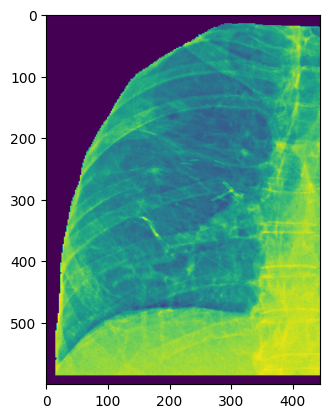

In [30]:
plt.imshow(img_np[:,0:img_np.shape[1]].T)

In [ ]:
l2x1 = lung_centroid
l2x2 = min(int(lung_centroid+crop_x_len),img_np.shape[0])

In [ ]:
img_np[lung_centroid:min(int(lung_centroid+crop_x_len),img_np.shape[0]),0:img_np.shape[1]].T, axis=1))

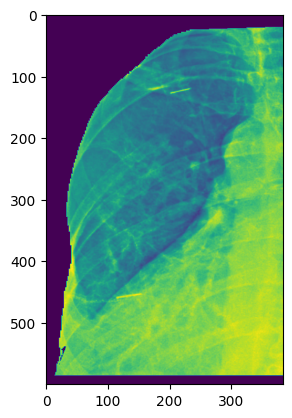

In [31]:
plt.imshow(np.flip(img_np[lung_centroid:min(int(lung_centroid+crop_x_len),img_np.shape[0]),0:img_np.shape[1]].T, axis=1))

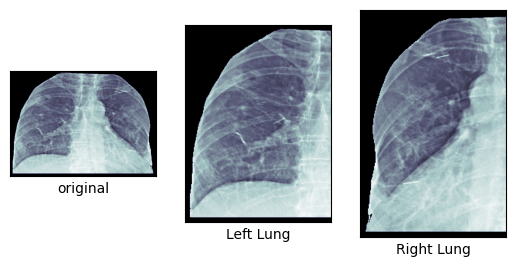

In [29]:
# max crop
img_np, seg_result = img, mask
# seperate lung masks
numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
#drop row with max area (automatic label of full img generated by method)
stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
# calculate the left and right lung segments
l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
# identify inner lung points
l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
r_in = r_stats[cv2.CC_STAT_LEFT]
# lung centroid
lung_centroid = int(l_in + ((r_in-l_in)/2))
# crop dims - biggest
crop_x_len = max(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))
lll, rrr = img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T,\
       np.flip(img_np[lung_centroid:min(int(lung_centroid+crop_x_len),img_np.shape[0]),0:img_np.shape[1]].T, axis=1)

# temp split
fig = plt.figure()

ax0 = fig.add_subplot(1,3,1)
plt.setp(ax0.get_xticklabels(),visible=(False))
plt.setp(ax0.get_yticklabels(),visible=(False))
ax0.imshow(img_np.T,cmap="bone")
ax0.set_xlabel('original')
ax0.tick_params(axis='both', which='both', length=0)

ax = fig.add_subplot(1,3,2)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lll,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,3,3)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(rrr,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

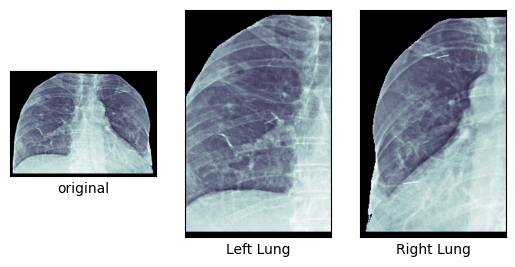

In [22]:
# max crop
img_np, seg_result = img, mask
# seperate lung masks
numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
#drop row with max area (automatic label of full img generated by method)
stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
# calculate the left and right lung segments
l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
# identify inner lung points
l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
r_in = r_stats[cv2.CC_STAT_LEFT]
# lung centroid
lung_centroid = int(l_in + ((r_in-l_in)/2))
# crop dims - thinnest
crop_x_len = min(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))
lll, rrr = img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T,\
       np.flip(img_np[lung_centroid:min(int(lung_centroid+crop_x_len),img_np.shape[0]),0:img_np.shape[1]].T, axis=1)

# temp split
fig = plt.figure()

ax0 = fig.add_subplot(1,3,1)
plt.setp(ax0.get_xticklabels(),visible=(False))
plt.setp(ax0.get_yticklabels(),visible=(False))
ax0.imshow(img_np.T,cmap="bone")
ax0.set_xlabel('original')
ax0.tick_params(axis='both', which='both', length=0)

ax = fig.add_subplot(1,3,2)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lll,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,3,3)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(rrr,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)

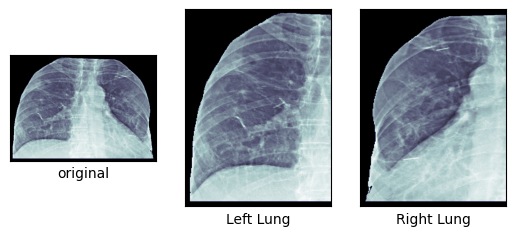

In [24]:
# stretch process
img_np, seg_result = img, mask
# seperate lung masks
numLabels, labels, stats, centroids = cv2.connectedComponentsWithStats(seg_result.T)
#drop row with max area (automatic label of full img generated by method)
stats = np.delete(stats,np.argmax(stats.T[4]), axis=0)
# calculate the left and right lung segments
l_stats, r_stats = stats[np.argmin(stats.T[0])],stats[np.argmax(stats.T[0])]
# identify inner lung points
l_in = l_stats[cv2.CC_STAT_LEFT]+l_stats[cv2.CC_STAT_WIDTH]
r_in = r_stats[cv2.CC_STAT_LEFT]
# lung centroid
lung_centroid = int(l_in + ((r_in-l_in)/2))
# crop dims - widest
crop_x_len = max(int(img_np.shape[0]-lung_centroid),int(0+lung_centroid))

# Create the initial crops
# left_half = img_np[int(lung_centroid-crop_x_len):lung_centroid,0:img_np.shape[1]].T
left_half = img_np[max(0,int(lung_centroid-crop_x_len)):lung_centroid,0:img_np.shape[1]].T

right_half = img_np[lung_centroid:int(lung_centroid+crop_x_len),0:img_np.shape[1]].T

# Get actual widths of each half
left_width = left_half.shape[1]
right_width = right_half.shape[1]

# Determine target width (the wider of the two)
target_width = max(left_width, right_width)

# Resize the narrower half to match the wider one
if left_width < target_width:
    left_half = cv2.resize(left_half, (target_width, left_half.shape[0]), interpolation=cv2.INTER_LINEAR)
elif right_width < target_width:
    right_half = cv2.resize(right_half, (target_width, right_half.shape[0]), interpolation=cv2.INTER_LINEAR)
lll,rrr = left_half, np.flip(right_half, axis=1)


fig = plt.figure()

ax0 = fig.add_subplot(1,3,1)
plt.setp(ax0.get_xticklabels(),visible=(False))
plt.setp(ax0.get_yticklabels(),visible=(False))
ax0.imshow(img_np.T,cmap="bone")
ax0.set_xlabel('original')
ax0.tick_params(axis='both', which='both', length=0)

ax = fig.add_subplot(1,3,2)
plt.setp(ax.get_xticklabels(),visible=(False))
plt.setp(ax.get_yticklabels(),visible=(False))
ax.imshow(lll,cmap="bone")
ax.set_xlabel('Left Lung')
ax.tick_params(axis='both', which='both', length=0)

ax2 = fig.add_subplot(1,3,3)
plt.setp(ax2.get_xticklabels(),visible=(False))
plt.setp(ax2.get_yticklabels(),visible=(False))
# ax2.imshow(np.flip(lung_r, axis=1),cmap="bone")
ax2.imshow(rrr,cmap="bone")

ax2.set_xlabel('Right Lung')
ax2.tick_params(axis='both', which='both', length=0)